In [1]:
import lightkurve as lk
import numpy as np
import dynesty
import corner
import scipy 
import pandas as pd
import seaborn as sns

from functools import partial
import jax.numpy as jnp
from jax import jit
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from scipy.stats import norm


## Read in the APOKASC catalogue

https://www.dropbox.com/s/k33td8ukefwy5tv/APOKASC2_Table5.txt?dl=0;

In [2]:
sfile = '../data/APOKASC2_Table5.txt'
df = pd.read_csv(sfile, sep='\t')
df = df.loc[df.Teff > 10]
df = df.loc[df.Dnu > 2]
df = df[['KIC', 'Dnu', 'Nmax', 'Teff']]
df.head()

,KIC,Dnu,Nmax,Teff
1,1027337,6.991,73.975,4636.0
2,1160789,3.545,25.209,4729.6
4,1161447,4.153,37.066,4776.1
5,1161618,4.093,33.926,4742.0
7,1162746,3.763,27.798,4798.1


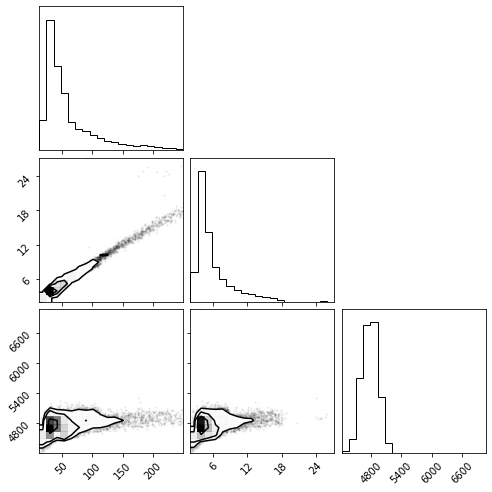

In [3]:
corner.corner(df[['Nmax', 'Dnu', 'Teff']]);

In [4]:
class expand():
    def __init__(self, plot=True):
        self.plot = plot
    
    def learn(self, X, n_components=2):
        '''
        X: array-like
            The training data
        
        '''
        self.pca = PCA(n_components=n_components)
        self.pca.fit(np.log10(self.outlier_rejection(X)))
        print(f'Explained variance : {self.pca.explained_variance_ratio_}')
        
    def outlier_rejection(self, X, cont=0.05):
        ''' Isolation forest outlier rejection
        
        X: array-like
            Data to fit
            
        cont: float
            Value between 0.0 and 0.5 for the estimated fraction of outliers.
            There is also an 'auto' option but this seems too agressive for our
            use.
        '''
        clf = IsolationForest(contamination=cont).fit(X)
        return X[clf.predict(X) > 0]
    
    def get_latent_summary(self, D):
        latent = self.transform(D)
        self.summary = [np.mean(latent, axis=0), np.std(latent, axis=0)]
    
    def plot_compare(self, D):
        fig = corner.corner(D, color='r')
        latent = self.transform(D)
        D_ = self(latent)
        corner.corner(D_, fig=fig, color='b')
        
    def plot_latent(self, D):
        latent = self.transform(D)
        fig = corner.corner(latent, color='r')
        self.get_latent_summary(full)
        mc = np.random.multivariate_normal(self.summary[0], 
                                           [[self.summary[1][0]**2, 0],
                                            [0, self.summary[1][1]**2]],
                                          size=100)
        corner.corner(mc, fig=fig)
    
    def transform(self, D): 
        if np.any(D < 0):
            print('Negative numbers?!?')
        return self.pca.transform(np.log10(D))
    
    def __call__(self, latent):
        return 10**self.pca.inverse_transform(latent)

Explained variance : [0.84660982 0.0926473 ]


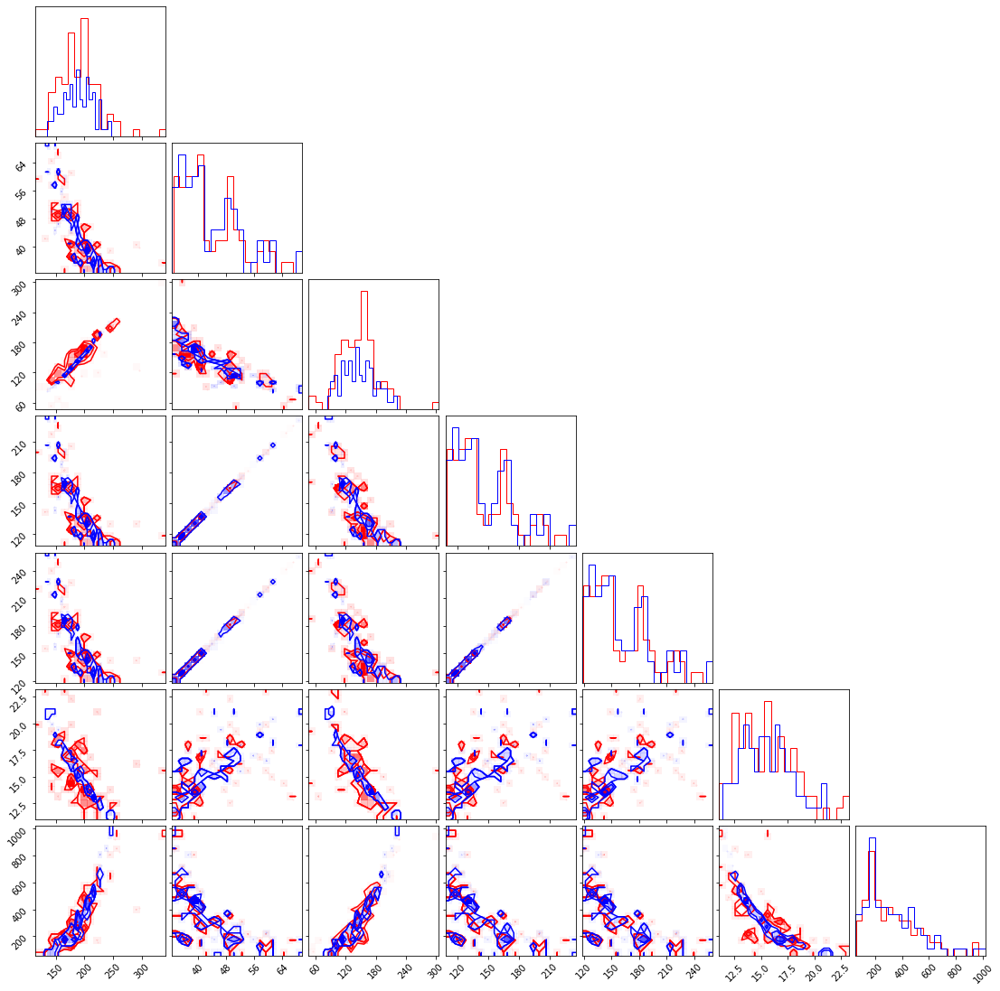

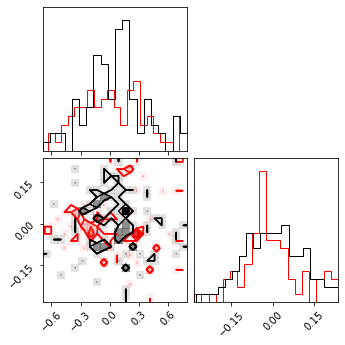

In [5]:
def old(l):
        ''' From Kalinger 2014'''
        numax, delta_a1, delta_a2, delta_width, delta_height = l 
        p = [delta_a1 * 3382 * numax**-0.609, 
             0.317 * numax**0.970, 
             delta_a2 * 3382 * numax**-0.609, 
             0.948 * numax**0.992,
             numax, 
             delta_width * 0.3 * numax **0.8, 
             delta_height * 3335 * numax**-0.564]
        return p

ln = pd.read_csv('learnt.csv')
ln.head()
ln = ln[ln.Numax > 100]
ln = ln[ln.d3 > 0.2]
ln = ln[ln.d3 < 2.0]
lnn = ln.drop(columns=['KIC', 'White']).to_numpy()
full = np.array([old(n) for n in lnn])

ex = expand()
ex.learn(full, n_components=2)
ex.get_latent_summary(full)
ex.plot_compare(full)
ex.plot_latent(full)

In [6]:
class dtwoterm():
    ''' At some point should JAX '''
    def __init__(self, pg, pca):
        self.pg = pg
        self.f = self.pg.frequency.value
        self.O = self.pg.power.value
        self.O = self.O[len(self.f) % 4:]
        self.f = self.f[len(self.f) % 4:]
        self.f_dash = np.arange(self.f[0], self.f[-1] * 2, self.f[1] - self.f[0])
        self.pca = pca
        
    def harvey(self, a, b, c=4):
        return a**2 / b / (1 + (self.f_dash / b)**c)
    
    def eta(self):
        ''' TODO calculate just once ?!?'''
        x = jnp.pi * self.f_dash / 2 / self.f.max()
        return np.sin(x) / x
    
    def hump(self, numax, width, height):
        return height * jnp.exp(-0.5 * (self.f_dash - numax)**2 / width**2)
    
    @partial(jit, static_argnums=0)
    def model(self, p): 
        a1, b1, a2, b2, numax, width, height, white = p
        mod = (self.harvey(a1, b1) + self.harvey(a2, b2) + self.hump(numax, width, height)) * self.eta()**2 + white
        return jnp.abs(mod[:len(self.f)] + mod[-1:len(mod) - len(self.f) - 1:-1])
    
    def full_model(self, l):
        return self.model(self.expand(l))
    
    #@partial(jit, static_argnums=0)
    def loglike(self, l): 
        M = self.full_model(l)
        return -0.5 * jnp.sum(jnp.log(M) + self.O/M)
    
    def expand(self, l):
        p = self.pca(l[:2])
        return [l[2] * p[0], 
                 p[1], 
                 l[3] * p[2], 
                 p[3],
                 p[4], 
                 l[4] * p[5], 
                 l[5] * p[6], 
                 l[6]]
    
    def ptform(self, u): 
        return [scipy.stats.norm.ppf(u[0]) * 
                    self.pca.summary[1][0]  + self.pca.summary[0][0], 
                scipy.stats.norm.ppf(u[1]) * 
                    self.pca.summary[1][1]  + self.pca.summary[0][1], 
                10**(scipy.stats.norm.ppf(u[2]) * 0.2),
                10**(scipy.stats.norm.ppf(u[3]) * 0.2),
                10**(scipy.stats.norm.ppf(u[4]) * 0.2),
                10**(scipy.stats.norm.ppf(u[5]) * 0.2),
                u[6] * 2 * np.median(self.O[-100:-1])]
    
    def __call__(self): 
        self.sampler = dynesty.NestedSampler(self.loglike, self.ptform, 7,
                               nlive=200, sample='rwalk')
        self.sampler.run_nested()
        res = self.sampler.results
        
        samples, weights = res.samples, np.exp(res.logwt - res.logz[-1])
        new_samples = dynesty.utils.resample_equal(samples, weights)
        return new_samples
        

class tutor():
    def __init__(self, df, expand, plot=True, training=[-1], 
                    n_components=2):
        ''' 
        df: DataFrame 
            Contains the list of the targets with some information that might be useful
            
        expand: Func 
            Function that performs the expansion from latent space to full space
            
        plot: Bool 
        
        training: array_like 
            Array containg the current training data (cannot be empty)
            
        n_components: Int 
            Number of components (latent space) used by the expand function
        
        '''
        self.df = df
        self.plot = plot
        self.output_file = 'learnt_new.csv'
        self.labels = ['KIC', 'Numax', 'White', 'd1', 'd2', 'd3', 'Height']
        self.full_labels = ['a1', 'b1', 'a2', 'b2', 'numax', 'width', 'height']
        try:
            self.output_df = pd.read_csv(self.output_file)
        except:
            self.output_df = pd.DataFrame(columns=self.labels)
        self.expand = expand
        self.training = training
        self.n_components = n_components
        
    def pick_one(self): 
        weights = norm.pdf(self.df.Nmax, self.training[:, 4].mean(), self.training[:, 4].std())
        return self.df.sample(weights=weights)
    
    def start(self):
        self.target = self.pick_one()
        print(self.target)
        
    def get_target_data(self):
        q = np.random.randint(1, 17)
        self.lc = lk.search_lightcurve('KIC ' + str(self.target.KIC.values[0]), author="Kepler", 
                                  quarter=q, cadence="long").download_all().stitch()
        self.lc = self.lc.normalize()
        self.lc.flux *= 1e6
        self.pg = self.lc.to_periodogram(oversample_factor=1, 
                                         minimum_frequency=10.0,
                                         normalization='PSD')
        if self.plot:
            self.plot_guess()
            
    def plot_guess(self):
        self.fit = dtwoterm(self.pg, self.expand)
        ax = self.pg.plot('log')
        ax.plot(self.pg.frequency, self.pg.smooth(filter_width=2.0).power)
        ax.plot(self.fit.f, self.fit.full_model([0, 0, 1., 1., 1., 1., 
                                                 np.median(self.fit.O[-100:-1]) / 2]))
        ax.set_xlim([10, 288])
            
    def fit_target_data(self):
        self.fit = dtwoterm(self.pg, self.expand)
        self.samples = self.fit()
        if self.plot:
            corner.corner(self.samples)
            self.posterior_pred_plot()
            
    def posterior_pred_plot(self):
        ax = self.pg.plot('log')
        ax.plot(self.pg.frequency, self.pg.smooth(filter_width=2.0).power)
        ax.plot(self.pg.frequency, self.pg.smooth(filter_width=20.0).power)
        for i in range(100):
            ax.plot(self.fit.f, self.fit.full_model(self.samples[i, :]), c='r', alpha=0.05)
        ax.set_xlim(10, 288)
        
    def save_summary_stats(self, output): 
        print(output)
        nd = [[i, *output[i]] for i in output]
        tmp = pd.DataFrame(columns=self.labels, data=nd)
        tmp.to_csv(self.output_file, index=False)
        
    def save_training(self):
        pd.DataFrame(data=self.training, columns=self.full_labels).to_csv(self.output_file, index=False)
        
    def run_n(self, n):
        for i in range(n):
            self.expand.learn(self.training, n_components=self.n_components)
            self.expand.get_latent_summary(self.training)
            try: 
                self.start()
                self.get_target_data()
                self.fit_target_data()
                self.posterior_pred_plot()
                self.training = np.vstack([self.training, self.fit.expand(np.mean(self.samples, axis=0))[:-1]])
                self.save_training()
            except Exception as exception: 
                print(f'Failed on {i}')
                print(exception)
        #self.save_summary_stats(output)
        

Explained variance : [0.84626863 0.09259263]
          KIC    Dnu    Nmax    Teff
1503  5356201  15.76  209.18  4839.2


3214it [01:16, 42.02it/s, +200 | bound: 83 | nc: 1 | ncall: 74533 | eff(%):  4.593 | loglstar:   -inf < -6685.360 <    inf | logz: -6699.815 +/-  0.256 | dlogz:  0.001 >  0.209]


Explained variance : [0.8397289  0.09981749]
          KIC    Dnu     Nmax    Teff
1727  5639438  13.17  180.806  4896.8


2760it [01:06, 41.36it/s, +200 | bound: 69 | nc: 1 | ncall: 62672 | eff(%):  4.738 | loglstar:   -inf < -6558.924 <    inf | logz: -6571.106 +/-  0.235 | dlogz:  0.001 >  0.209]


Explained variance : [0.84110472 0.09814339]
          KIC     Dnu     Nmax    Teff
3853  8703146  10.284  121.804  4910.4


2820it [01:04, 43.91it/s, +200 | bound: 70 | nc: 1 | ncall: 63884 | eff(%):  4.742 | loglstar:   -inf < -6885.812 <    inf | logz: -6898.297 +/-  0.242 | dlogz:  0.001 >  0.209]


Explained variance : [0.83816416 0.09945846]
          KIC     Dnu     Nmax    Teff
4158  9119915  12.514  147.806  4888.7


2978it [01:15, 39.44it/s, +200 | bound: 75 | nc: 1 | ncall: 68102 | eff(%):  4.680 | loglstar:   -inf < -6305.711 <    inf | logz: -6318.982 +/-  0.248 | dlogz:  0.001 >  0.209]


Explained variance : [0.83423629 0.10357527]
         KIC    Dnu     Nmax    Teff
295  2990932  13.26  178.871  4813.0


2793it [01:09, 40.23it/s, +200 | bound: 70 | nc: 1 | ncall: 63420 | eff(%):  4.734 | loglstar:   -inf < -5775.715 <    inf | logz: -5788.062 +/-  0.241 | dlogz:  0.001 >  0.209]


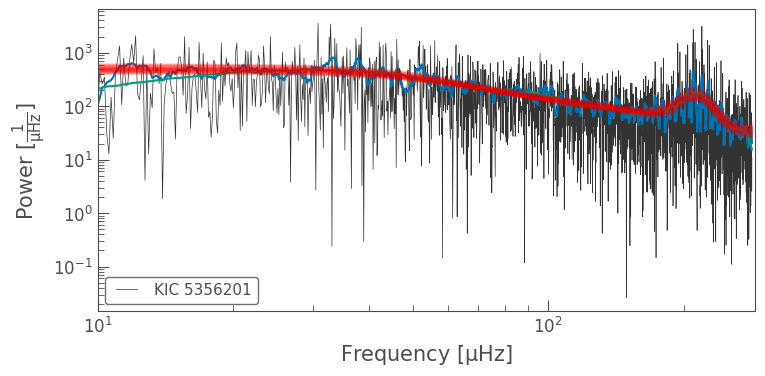

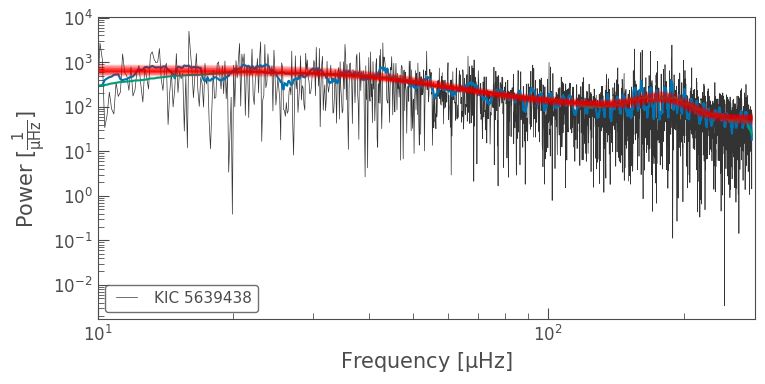

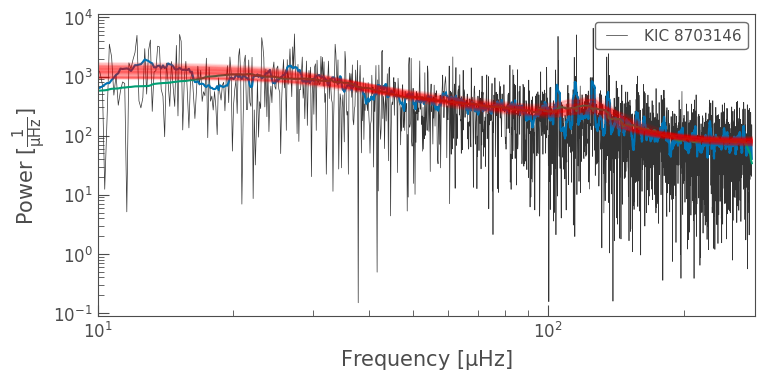

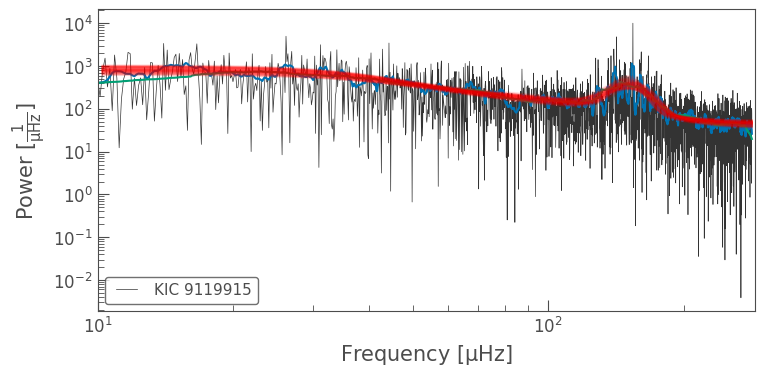

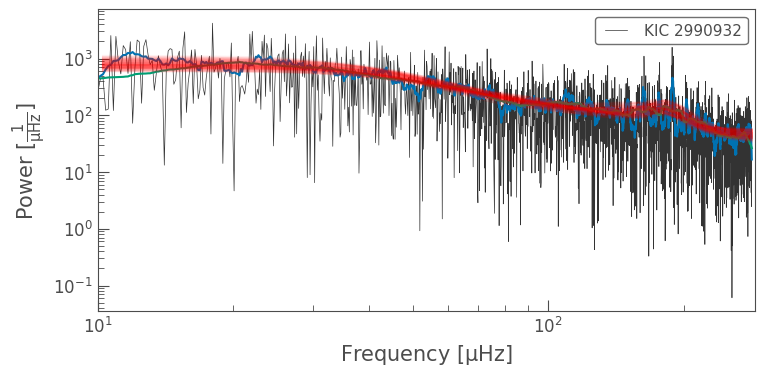

In [7]:
apo = tutor(df, ex, training=full, plot=False)
apo.run_n(5)

In [ ]:
apo.run_n(25)

Explained variance : [0.83589794 0.10118858]
          KIC    Dnu    Nmax    Teff
1857  5854149  4.342  40.005  4765.4


5303it [01:43, 51.33it/s, +200 | bound: 154 | nc: 1 | ncall: 130493 | eff(%):  4.224 | loglstar:   -inf < -5875.312 <    inf | logz: -5900.245 +/-  0.333 | dlogz:  0.001 >  0.209]


Explained variance : [0.8454136  0.09336029]
          KIC     Dnu     Nmax    Teff
4498  9534802  11.538  138.985  4663.4


3284it [01:20, 40.92it/s, +200 | bound: 88 | nc: 1 | ncall: 76585 | eff(%):  4.561 | loglstar:   -inf < -7144.738 <    inf | logz: -7159.553 +/-  0.258 | dlogz:  0.001 >  0.209]


Explained variance : [0.8448124  0.09534447]
          KIC     Dnu     Nmax    Teff
2737  7265993  13.737  182.728  4929.8


2839it [01:04, 43.82it/s, +200 | bound: 71 | nc: 1 | ncall: 64547 | eff(%):  4.723 | loglstar:   -inf < -6441.788 <    inf | logz: -6454.357 +/-  0.244 | dlogz:  0.001 >  0.209]


Explained variance : [0.84550613 0.09423176]
          KIC     Dnu     Nmax    Teff
1056  4729920  13.382  154.511  4892.6


2853it [01:02, 45.58it/s, +200 | bound: 72 | nc: 1 | ncall: 65353 | eff(%):  4.686 | loglstar:   -inf < -6614.132 <    inf | logz: -6626.782 +/-  0.241 | dlogz:  0.001 >  0.209]


Explained variance : [0.84279612 0.09531416]
          KIC     Dnu     Nmax    Teff
3317  8123432  11.617  143.519  4851.8


2892it [01:03, 45.21it/s, +200 | bound: 74 | nc: 1 | ncall: 66598 | eff(%):  4.657 | loglstar:   -inf < -7237.806 <    inf | logz: -7250.654 +/-  0.243 | dlogz:  0.001 >  0.209]


Explained variance : [0.84408214 0.09444274]
          KIC     Dnu     Nmax    Teff
2420  6757558  11.226  131.185  4772.5


3274it [01:12, 45.00it/s, +200 | bound: 87 | nc: 1 | ncall: 76452 | eff(%):  4.556 | loglstar:   -inf < -6750.245 <    inf | logz: -6765.007 +/-  0.257 | dlogz:  0.001 >  0.209]


Explained variance : [0.84679332 0.09262909]
           KIC   Dnu     Nmax    Teff
6149  11456449  9.36  112.926  4851.5


3186it [01:05, 48.49it/s, +200 | bound: 82 | nc: 1 | ncall: 73744 | eff(%):  4.604 | loglstar:   -inf < -6388.663 <    inf | logz: -6402.977 +/-  0.258 | dlogz:  0.001 >  0.209]


Explained variance : [0.84173835 0.09845558]
         KIC     Dnu     Nmax    Teff
592  3733028  13.201  176.384  4964.9


3132it [01:13, 42.71it/s, +200 | bound: 82 | nc: 1 | ncall: 72909 | eff(%):  4.583 | loglstar:   -inf < -5865.946 <    inf | logz: -5879.985 +/-  0.254 | dlogz:  0.001 >  0.209]


Explained variance : [0.83970263 0.09884872]
          KIC     Dnu   Nmax    Teff
1290  5035304  11.437  139.3  4792.2


3142it [01:09, 44.93it/s, +200 | bound: 80 | nc: 1 | ncall: 72307 | eff(%):  4.635 | loglstar:   -inf < -6562.416 <    inf | logz: -6576.507 +/-  0.256 | dlogz:  0.001 >  0.209]


Explained variance : [0.84246655 0.09560964]
          KIC    Dnu    Nmax    Teff
3064  7762794  8.724  98.836  4981.1


3404it [01:13, 46.38it/s, +200 | bound: 90 | nc: 1 | ncall: 79922 | eff(%):  4.521 | loglstar:   -inf < -6523.710 <    inf | logz: -6539.110 +/-  0.267 | dlogz:  0.001 >  0.209]


Explained variance : [0.83990668 0.09846122]
          KIC     Dnu     Nmax    Teff
3062  7761336  15.536  193.129  4948.8


3136it [01:09, 44.85it/s, +200 | bound: 83 | nc: 1 | ncall: 72627 | eff(%):  4.606 | loglstar:   -inf < -6102.633 <    inf | logz: -6116.705 +/-  0.254 | dlogz:  0.001 >  0.209]


Explained variance : [0.84341763 0.09684775]
          KIC   Dnu     Nmax    Teff
4110  9071153  9.98  116.011  4754.3


3410it [01:15, 45.42it/s, +200 | bound: 90 | nc: 1 | ncall: 79615 | eff(%):  4.546 | loglstar:   -inf < -6621.149 <    inf | logz: -6636.593 +/-  0.267 | dlogz:  0.001 >  0.209]


Explained variance : [0.84692755 0.09342087]
           KIC     Dnu     Nmax    Teff
6048  11309182  13.173  159.916  4913.5


1033it [00:14, 39.56it/s, bound: 11 | nc: 27 | ncall: 15715 | eff(%):  6.573 | loglstar:   -inf < -6872.473 <    inf | logz: -6880.130 +/-  0.181 | dlogz: 29.389 >  0.209]

Explained variance : [0.81331989 0.13180428]
         KIC    Dnu   Nmax    Teff
533  3555292  5.392  56.32  4903.9


4491it [01:42, 43.75it/s, +200 | bound: 127 | nc: 1 | ncall: 108564 | eff(%):  4.329 | loglstar:   -inf < -21417.795 <    inf | logz: -21438.673 +/-  0.252 | dlogz:  0.001 >  0.209]


Explained variance : [0.8180787  0.12841692]
          KIC     Dnu     Nmax    Teff
1468  5295280  14.809  198.939  4899.8


3460it [01:37, 35.62it/s, +200 | bound: 93 | nc: 1 | ncall: 81600 | eff(%):  4.496 | loglstar:   -inf < -32961.570 <    inf | logz: -32977.252 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.82283085 0.1248179 ]
           KIC    Dnu    Nmax    Teff
5446  10602372  8.146  93.934  4653.4


4348it [02:06, 34.31it/s, +200 | bound: 123 | nc: 1 | ncall: 105741 | eff(%):  4.309 | loglstar:   -inf < -33744.656 <    inf | logz: -33764.752 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.82630787 0.12242284]
         KIC     Dnu     Nmax    Teff
562  3647215  11.851  135.841  4778.9


4169it [02:09, 32.22it/s, +200 | bound: 118 | nc: 1 | ncall: 101312 | eff(%):  4.321 | loglstar:   -inf < -33688.734 <    inf | logz: -33707.955 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.82779673 0.12122229]
           KIC    Dnu     Nmax    Teff
5953  11231255  13.02  173.507  4884.6


3884it [01:57, 33.06it/s, +200 | bound: 105 | nc: 1 | ncall: 92511 | eff(%):  4.424 | loglstar:   -inf < -33695.020 <    inf | logz: -33712.810 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.82746959 0.12133977]
          KIC    Dnu    Nmax    Teff
1061  4736611  7.946  91.816  4892.5


4500it [02:10, 34.57it/s, +200 | bound: 126 | nc: 1 | ncall: 109457 | eff(%):  4.302 | loglstar:   -inf < -30070.111 <    inf | logz: -30090.978 +/-  0.234 | dlogz:  0.001 >  0.209]


Explained variance : [0.82322205 0.12589725]
           KIC     Dnu    Nmax    Teff
5744  10977146  12.777  161.08  4841.7


3883it [01:59, 32.44it/s, +200 | bound: 106 | nc: 1 | ncall: 92975 | eff(%):  4.401 | loglstar:   -inf < -33494.148 <    inf | logz: -33511.941 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.82353368 0.12527301]
          KIC    Dnu   Nmax    Teff
1725  5637392  7.678  82.59  4825.2


4513it [02:13, 33.87it/s, +200 | bound: 127 | nc: 1 | ncall: 109753 | eff(%):  4.302 | loglstar:   -inf < -32933.895 <    inf | logz: -32954.830 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.82753401 0.12298124]
           KIC    Dnu     Nmax    Teff
5323  10449846  14.24  182.512  4733.2


3986it [02:05, 31.75it/s, +200 | bound: 113 | nc: 1 | ncall: 96616 | eff(%):  4.342 | loglstar:   -inf < -34025.039 <    inf | logz: -34043.342 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.82085119 0.12793349]
          KIC     Dnu     Nmax    Teff
3891  8754274  10.949  130.131  4723.7


4047it [02:04, 32.48it/s, +200 | bound: 113 | nc: 1 | ncall: 97587 | eff(%):  4.361 | loglstar:   -inf < -35587.523 <    inf | logz: -35606.134 +/-  0.029 | dlogz:  0.001 >  0.209]


Explained variance : [0.82348655 0.12634775]
          KIC    Dnu    Nmax    Teff
1474  5302674  8.517  95.341  4754.9


4206it [02:04, 33.92it/s, +200 | bound: 116 | nc: 1 | ncall: 101157 | eff(%):  4.364 | loglstar:   -inf < -36216.391 <    inf | logz: -36235.791 +/-  0.202 | dlogz:  0.001 >  0.209]


Explained variance : [0.82674029 0.1241078 ]
          KIC    Dnu    Nmax    Teff
2710  7204026  7.612  79.767  4690.1


4717it [02:17, 34.18it/s, +200 | bound: 137 | nc: 1 | ncall: 116226 | eff(%):  4.238 | loglstar:   -inf < -33857.480 <    inf | logz: -33879.432 +/-  0.110 | dlogz:  0.001 >  0.209]


Explained variance : [0.83099841 0.12083712]
          KIC     Dnu     Nmax    Teff
2920  7591451  10.992  127.442  4736.5


3987it [02:03, 32.27it/s, +200 | bound: 111 | nc: 1 | ncall: 96039 | eff(%):  4.369 | loglstar:   -inf < -34481.281 <    inf | logz: -34499.585 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.83262553 0.11964738]
           KIC    Dnu     Nmax    Teff
6374  11802908  9.013  104.769  4770.1


4215it [02:07, 32.96it/s, +200 | bound: 120 | nc: 1 | ncall: 101841 | eff(%):  4.344 | loglstar:   -inf < -33876.180 <    inf | logz: -33895.632 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.83440431 0.11836025]
           KIC    Dnu   Nmax    Teff
4980  10018811  7.321  76.84  4902.2


4609it [02:13, 34.58it/s, +200 | bound: 132 | nc: 1 | ncall: 112961 | eff(%):  4.265 | loglstar:   -inf < -33925.426 <    inf | logz: -33946.840 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.8359266  0.11730426]
         KIC     Dnu     Nmax    Teff
343  3120486  10.622  136.498  4859.4


3962it [01:56, 33.89it/s, +200 | bound: 110 | nc: 1 | ncall: 95169 | eff(%):  4.382 | loglstar:   -inf < -31286.455 <    inf | logz: -31304.639 +/-  0.280 | dlogz:  0.001 >  0.209]


Explained variance : [0.83495067 0.11805345]
          KIC     Dnu     Nmax    Teff
4843  9882766  13.005  164.802  4992.3


4139it [02:07, 32.38it/s, +200 | bound: 115 | nc: 1 | ncall: 99637 | eff(%):  4.364 | loglstar:   -inf < -31432.279 <    inf | logz: -31451.354 +/-  0.292 | dlogz:  0.001 >  0.209]


Explained variance : [0.8347473 0.1181657]
          KIC     Dnu     Nmax    Teff
2304  6584555  13.374  170.416  4745.7


4044it [02:03, 32.64it/s, +200 | bound: 114 | nc: 1 | ncall: 98041 | eff(%):  4.338 | loglstar:   -inf < -35891.289 <    inf | logz: -35909.887 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.83306933 0.11926255]
          KIC    Dnu    Nmax    Teff
2200  6385953  7.821  88.648  4698.6


4360it [02:06, 34.57it/s, +200 | bound: 125 | nc: 1 | ncall: 106249 | eff(%):  4.300 | loglstar:   -inf < -30864.715 <    inf | logz: -30884.872 +/-  0.256 | dlogz:  0.001 >  0.209]


Explained variance : [0.83118922 0.12175716]
          KIC   Dnu     Nmax    Teff
1829  5791045  9.71  109.492  4650.6


4242it [02:08, 32.95it/s, +200 | bound: 120 | nc: 1 | ncall: 102412 | eff(%):  4.346 | loglstar:   -inf < -35110.359 <    inf | logz: -35129.936 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.83587817 0.11832544]
          KIC     Dnu     Nmax    Teff
3450  8259226  11.404  141.167  4870.7


4154it [02:04, 33.29it/s, +200 | bound: 115 | nc: 1 | ncall: 100093 | eff(%):  4.359 | loglstar:   -inf < -31606.570 <    inf | logz: -31625.711 +/-  0.270 | dlogz:  0.001 >  0.209]
/Users/grd/Repos/matriculate/matriculate_env/lib/python3.9/site-packages/lightkurve/periodogram.py:364: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


Explained variance : [0.8357738  0.11822062]
          KIC    Dnu     Nmax    Teff
3486  8301905  11.84  138.889  4985.8


3829it [01:53, 33.76it/s, +200 | bound: 105 | nc: 1 | ncall: 91378 | eff(%):  4.419 | loglstar:   -inf < -34566.430 <    inf | logz: -34583.964 +/-  0.054 | dlogz:  0.001 >  0.209]


Explained variance : [0.83568457 0.11814237]
        KIC     Dnu     Nmax    Teff
35  1723047  11.451  143.314  5005.8


3833it [01:48, 35.44it/s, +200 | bound: 104 | nc: 1 | ncall: 91135 | eff(%):  4.435 | loglstar:   -inf < -30863.547 <    inf | logz: -30881.077 +/-  0.256 | dlogz:  0.001 >  0.209]


Explained variance : [0.83479346 0.11823984]
         KIC    Dnu     Nmax    Teff
226  2584477  9.765  112.329  4781.7


4073it [02:04, 32.83it/s, +200 | bound: 114 | nc: 1 | ncall: 98412 | eff(%):  4.351 | loglstar:   -inf < -34101.684 <    inf | logz: -34120.425 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.83679431 0.11679646]
          KIC    Dnu    Nmax    Teff
1790  5733975  7.353  91.515  5124.7


4314it [01:58, 36.45it/s, +200 | bound: 121 | nc: 1 | ncall: 104479 | eff(%):  4.329 | loglstar:   -inf < -32131.002 <    inf | logz: -32150.936 +/-  0.270 | dlogz:  0.001 >  0.209]


Explained variance : [0.83060842 0.12213097]
         KIC     Dnu   Nmax    Teff
992  4571650  13.269  175.5  4991.0


3774it [01:41, 37.15it/s, +200 | bound: 102 | nc: 1 | ncall: 89417 | eff(%):  4.454 | loglstar:   -inf < -17694.898 <    inf | logz: -17712.150 +/-  0.262 | dlogz:  0.001 >  0.209]


Explained variance : [0.83304178 0.120071  ]
          KIC     Dnu     Nmax    Teff
2884  7518143  12.327  156.518  4815.3


4126it [02:07, 32.45it/s, +200 | bound: 115 | nc: 1 | ncall: 100073 | eff(%):  4.332 | loglstar:   -inf < -32731.045 <    inf | logz: -32750.052 +/-  0.262 | dlogz:  0.001 >  0.209]


Explained variance : [0.83269847 0.12038887]
          KIC     Dnu    Nmax    Teff
1339  5112072  10.015  124.58  4906.1


3401it [01:34, 36.13it/s, +200 | bound: 90 | nc: 1 | ncall: 80022 | eff(%):  4.511 | loglstar:   -inf < -21717.148 <    inf | logz: -21732.540 +/-  0.201 | dlogz:  0.001 >  0.209]


Explained variance : [0.83269382 0.12017863]
          KIC     Dnu     Nmax    Teff
2391  6700106  11.333  139.854  4963.9


3958it [01:54, 34.62it/s, +200 | bound: 107 | nc: 1 | ncall: 94227 | eff(%):  4.422 | loglstar:   -inf < -30635.754 <    inf | logz: -30653.914 +/-  0.267 | dlogz:  0.001 >  0.209]


Explained variance : [0.82890945 0.12343728]
           KIC    Dnu     Nmax    Teff
5851  11086673  9.514  119.107  4819.0


3737it [01:48, 34.53it/s, +200 | bound: 102 | nc: 1 | ncall: 88775 | eff(%):  4.445 | loglstar:   -inf < -32216.057 <    inf | logz: -32233.128 +/-  0.202 | dlogz:  0.001 >  0.209]


Explained variance : [0.82680818 0.1254358 ]
           KIC    Dnu     Nmax    Teff
5953  11231255  13.02  173.507  4884.6


3862it [01:55, 33.43it/s, +200 | bound: 107 | nc: 1 | ncall: 92322 | eff(%):  4.409 | loglstar:   -inf < -33695.031 <    inf | logz: -33712.714 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.82880141 0.12378612]
          KIC     Dnu     Nmax    Teff
3062  7761336  15.536  193.129  4948.8


4060it [02:04, 32.51it/s, +200 | bound: 115 | nc: 1 | ncall: 98311 | eff(%):  4.342 | loglstar:   -inf < -31483.969 <    inf | logz: -31502.644 +/-  0.254 | dlogz:  0.001 >  0.209]


Explained variance : [0.82898394 0.12370063]
          KIC    Dnu     Nmax    Teff
4729  9775302  12.17  154.876  5010.3


3879it [01:52, 34.44it/s, +200 | bound: 108 | nc: 1 | ncall: 92855 | eff(%):  4.402 | loglstar:   -inf < -30886.057 <    inf | logz: -30903.832 +/-  0.218 | dlogz:  0.001 >  0.209]


Explained variance : [0.82741902 0.12494509]
         KIC    Dnu     Nmax    Teff
803  4137210  9.846  117.076  4873.2


4015it [02:03, 32.54it/s, +200 | bound: 112 | nc: 1 | ncall: 96651 | eff(%):  4.370 | loglstar:   -inf < -32484.133 <    inf | logz: -32502.585 +/-  0.217 | dlogz:  0.001 >  0.209]


Explained variance : [0.8268094  0.12526276]
          KIC     Dnu     Nmax    Teff
2320  6592034  12.598  147.156  4824.8


4032it [02:01, 33.24it/s, +200 | bound: 111 | nc: 1 | ncall: 96745 | eff(%):  4.383 | loglstar:   -inf < -34779.512 <    inf | logz: -34798.050 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.82688716 0.12532673]
          KIC    Dnu    Nmax    Teff
3327  8142438  8.743  97.133  4836.1


4178it [02:04, 33.56it/s, +200 | bound: 116 | nc: 1 | ncall: 101144 | eff(%):  4.337 | loglstar:   -inf < -35637.555 <    inf | logz: -35656.802 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.83055054 0.12194762]
          KIC    Dnu    Nmax    Teff
1753  5702180  4.775  46.085  4981.4


7710it [03:23, 37.94it/s, +200 | bound: 239 | nc: 1 | ncall: 195904 | eff(%):  4.042 | loglstar:   -inf < -27788.992 <    inf | logz: -27825.883 +/-  0.388 | dlogz:  0.001 >  0.209]


Explained variance : [0.83341093 0.12081203]
         KIC     Dnu   Nmax    Teff
352  3129312  12.636  149.9  4799.6


3673it [01:40, 36.37it/s, +200 | bound: 100 | nc: 1 | ncall: 86740 | eff(%):  4.475 | loglstar:   -inf < -22043.221 <    inf | logz: -22059.967 +/-  0.219 | dlogz:  0.001 >  0.209]


Explained variance : [0.83329798 0.12042447]
          KIC   Dnu     Nmax    Teff
3739  8583313  12.8  149.957  4782.5


3926it [01:59, 32.91it/s, +200 | bound: 110 | nc: 1 | ncall: 95082 | eff(%):  4.349 | loglstar:   -inf < -34763.250 <    inf | logz: -34781.252 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.83308386 0.12060917]
          KIC     Dnu     Nmax    Teff
3481  8299489  11.561  140.279  4921.5


3906it [01:55, 33.77it/s, +200 | bound: 106 | nc: 1 | ncall: 93038 | eff(%):  4.423 | loglstar:   -inf < -33021.957 <    inf | logz: -33039.857 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.83262832 0.12134753]
          KIC    Dnu     Nmax    Teff
3751  8605197  9.702  109.515  4702.6


4266it [02:07, 33.51it/s, +200 | bound: 119 | nc: 1 | ncall: 102924 | eff(%):  4.348 | loglstar:   -inf < -34101.234 <    inf | logz: -34120.930 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.83622472 0.11814339]
          KIC    Dnu    Nmax    Teff
1589  5468123  8.563  95.182  4794.8


4612it [02:12, 34.72it/s, +200 | bound: 134 | nc: 1 | ncall: 113025 | eff(%):  4.265 | loglstar:   -inf < -40412.957 <    inf | logz: -40434.390 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84058464 0.11580378]
           KIC     Dnu     Nmax    Teff
5465  10614003  10.457  130.144  4895.6


3801it [01:52, 33.76it/s, +200 | bound: 105 | nc: 1 | ncall: 91073 | eff(%):  4.403 | loglstar:   -inf < -33852.297 <    inf | logz: -33869.675 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.83852081 0.11679645]
         KIC    Dnu     Nmax    Teff
526  3547041  8.987  103.285  4644.3


4188it [02:05, 33.36it/s, +200 | bound: 117 | nc: 1 | ncall: 100998 | eff(%):  4.353 | loglstar:   -inf < -32889.969 <    inf | logz: -32909.280 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84207991 0.1147425 ]
          KIC     Dnu     Nmax    Teff
3806  8654400  10.606  135.295  4858.5


4046it [01:56, 34.60it/s, +200 | bound: 111 | nc: 1 | ncall: 96778 | eff(%):  4.396 | loglstar:   -inf < -30396.227 <    inf | logz: -30414.835 +/-  0.259 | dlogz:  0.001 >  0.209]


Explained variance : [0.8397181  0.11596853]
          KIC    Dnu     Nmax    Teff
3446  8256020  11.36  138.379  4835.4


3960it [01:56, 34.08it/s, +200 | bound: 108 | nc: 1 | ncall: 94786 | eff(%):  4.398 | loglstar:   -inf < -30881.148 <    inf | logz: -30899.325 +/-  0.282 | dlogz:  0.001 >  0.209]


Explained variance : [0.84055822 0.1157393 ]
         KIC     Dnu     Nmax    Teff
927  4445549  15.904  198.004  4964.9


4103it [02:04, 32.95it/s, +200 | bound: 115 | nc: 1 | ncall: 98898 | eff(%):  4.360 | loglstar:   -inf < -31789.000 <    inf | logz: -31807.902 +/-  0.292 | dlogz:  0.001 >  0.209]


Explained variance : [0.84028339 0.11613557]
          KIC     Dnu     Nmax    Teff
2223  6437547  10.681  138.495  4994.9


3965it [01:59, 33.29it/s, +200 | bound: 108 | nc: 1 | ncall: 94647 | eff(%):  4.410 | loglstar:   -inf < -30824.848 <    inf | logz: -30843.043 +/-  0.257 | dlogz:  0.001 >  0.209]


Explained variance : [0.84003159 0.11615566]
          KIC    Dnu    Nmax    Teff
3384  8181700  4.571  45.857  4843.7


6522it [02:53, 37.52it/s, +200 | bound: 197 | nc: 1 | ncall: 163772 | eff(%):  4.110 | loglstar:   -inf < -28690.340 <    inf | logz: -28721.289 +/-  0.367 | dlogz:  0.001 >  0.209]


Explained variance : [0.838511   0.11676311]
           KIC     Dnu     Nmax    Teff
6581  12217017  10.074  117.758  4946.5


3809it [01:49, 34.94it/s, +200 | bound: 105 | nc: 1 | ncall: 90538 | eff(%):  4.438 | loglstar:   -inf < -33234.453 <    inf | logz: -33251.875 +/-    nan | dlogz:  0.001 >  0.209]


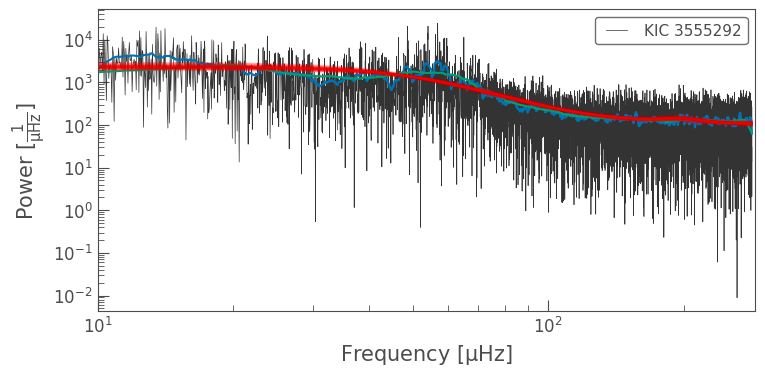

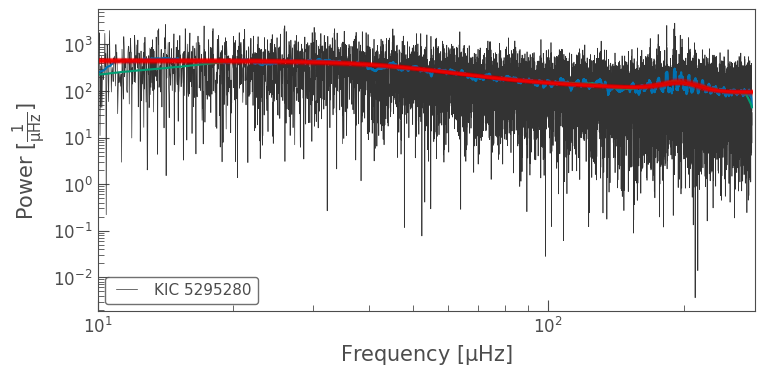

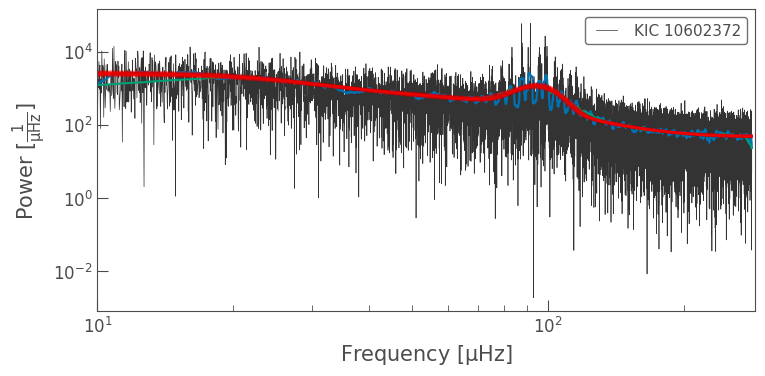

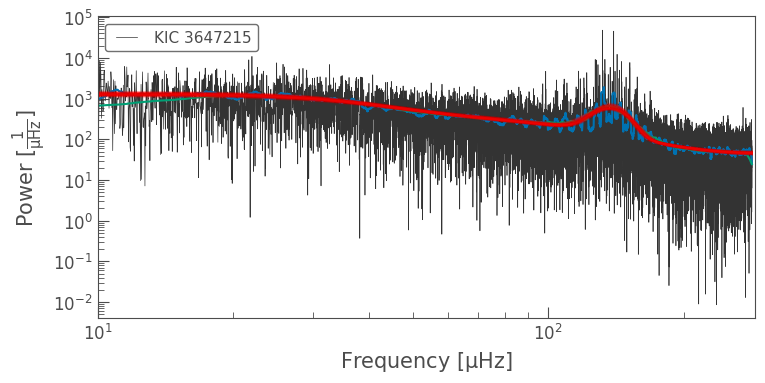

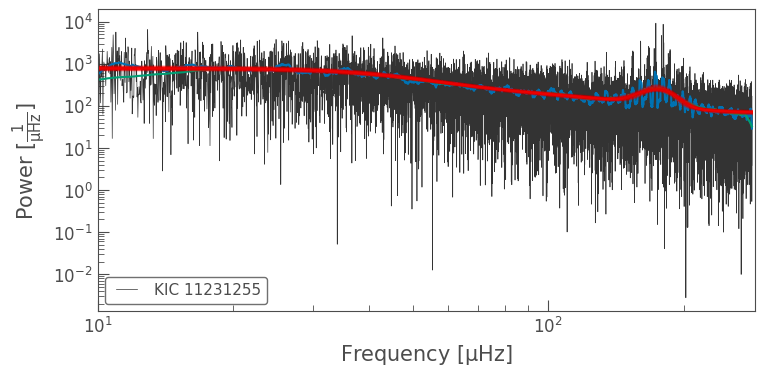

...

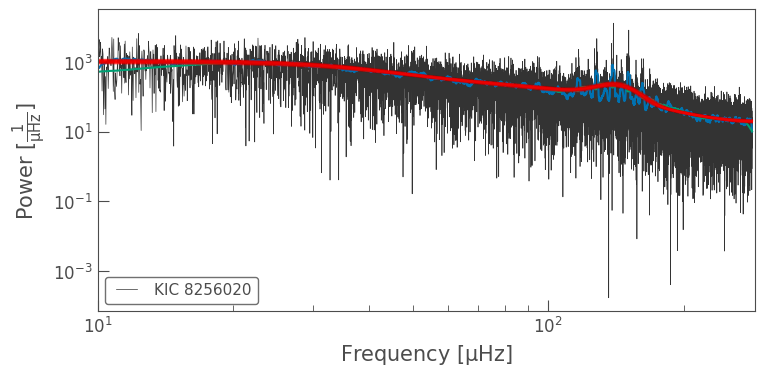

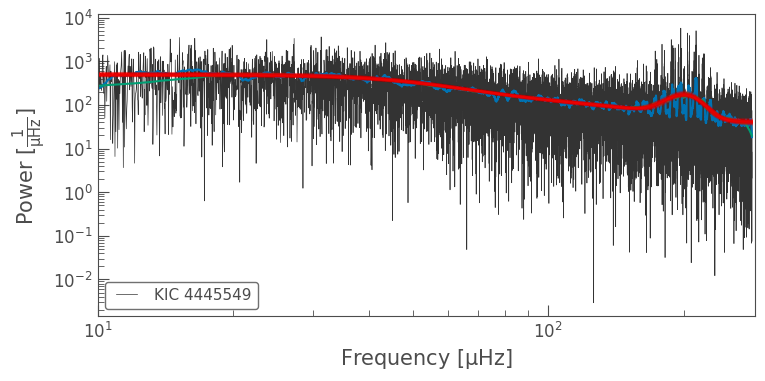

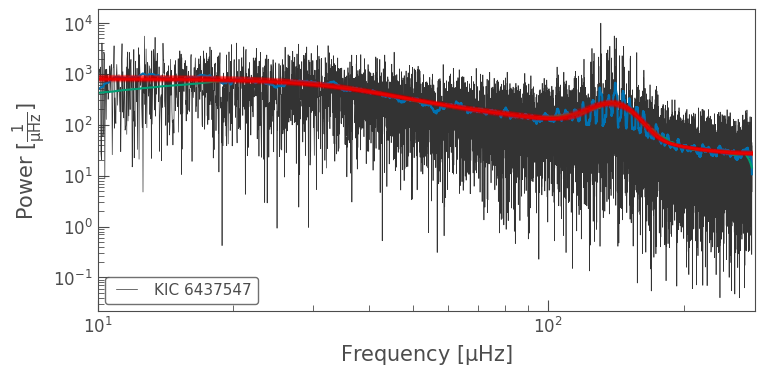

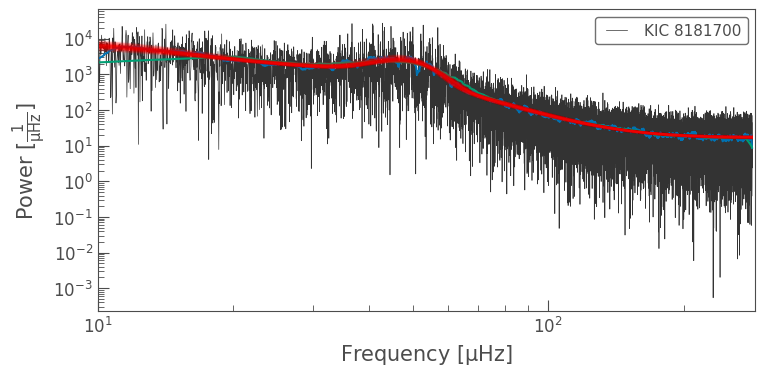

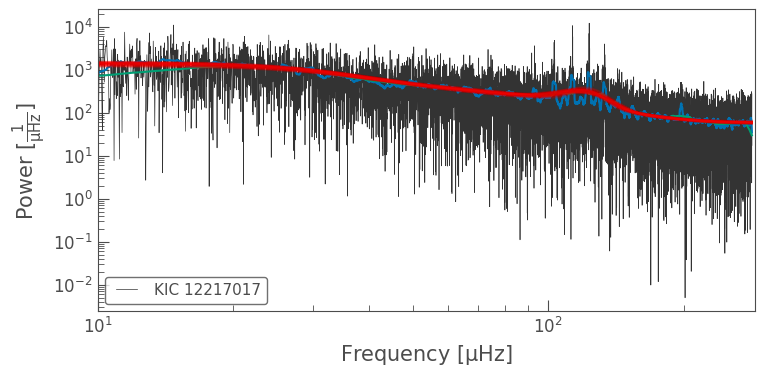

In [9]:
apo.run_n(50)

Explained variance : [0.83856245 0.11709804]
          KIC    Dnu    Nmax    Teff
1509  5359600  4.954  47.114  4700.6


7243it [03:20, 36.10it/s, +200 | bound: 223 | nc: 1 | ncall: 183204 | eff(%):  4.067 | loglstar:   -inf < -29855.055 <    inf | logz: -29889.621 +/-  0.386 | dlogz:  0.001 >  0.209]


Explained variance : [0.84137894 0.11521233]
          KIC    Dnu     Nmax    Teff
3780  8618934  9.449  103.629  4827.9


4097it [02:03, 33.11it/s, +200 | bound: 115 | nc: 1 | ncall: 98140 | eff(%):  4.387 | loglstar:   -inf < -34308.945 <    inf | logz: -34327.808 +/-  0.277 | dlogz:  0.001 >  0.209]


Explained variance : [0.8442213  0.11393735]
          KIC     Dnu     Nmax    Teff
3770  8613105  10.292  127.511  4860.0


4124it [02:04, 33.04it/s, +200 | bound: 114 | nc: 1 | ncall: 99027 | eff(%):  4.375 | loglstar:   -inf < -30202.309 <    inf | logz: -30221.306 +/-  0.224 | dlogz:  0.001 >  0.209]


Explained variance : [0.84309892 0.11393413]
          KIC    Dnu     Nmax    Teff
2892  7530849  8.741  103.177  4871.9


4066it [02:02, 33.08it/s, +200 | bound: 112 | nc: 1 | ncall: 97682 | eff(%):  4.376 | loglstar:   -inf < -32110.115 <    inf | logz: -32128.818 +/-  0.195 | dlogz:  0.001 >  0.209]


Explained variance : [0.84250914 0.11449804]
          KIC     Dnu     Nmax    Teff
1336  5111718  10.527  133.796  4956.3


3251it [01:25, 38.13it/s, +200 | bound: 86 | nc: 1 | ncall: 76038 | eff(%):  4.550 | loglstar:   -inf < -21989.648 <    inf | logz: -22004.297 +/-  0.182 | dlogz:  0.001 >  0.209]


Explained variance : [0.8421173  0.11448868]
          KIC    Dnu    Nmax    Teff
2564  6947706  8.675  94.865  4917.9


4216it [02:22, 29.58it/s, +200 | bound: 119 | nc: 1 | ncall: 102106 | eff(%):  4.333 | loglstar:   -inf < -33772.125 <    inf | logz: -33791.584 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84312451 0.11359691]
           KIC     Dnu     Nmax    Teff
6488  12021730  10.035  120.725  4880.8


3789it [01:53, 33.35it/s, +200 | bound: 104 | nc: 1 | ncall: 89996 | eff(%):  4.442 | loglstar:   -inf < -32818.930 <    inf | logz: -32836.255 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84188552 0.11469855]
           KIC    Dnu     Nmax    Teff
5486  10656842  10.49  123.028  4724.7


4144it [02:13, 31.04it/s, +200 | bound: 117 | nc: 1 | ncall: 101029 | eff(%):  4.308 | loglstar:   -inf < -33934.027 <    inf | logz: -33953.130 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84298459 0.11388427]
           KIC     Dnu     Nmax    Teff
6053  11337883  11.618  148.646  4900.2


4011it [02:06, 31.76it/s, +200 | bound: 111 | nc: 1 | ncall: 96434 | eff(%):  4.376 | loglstar:   -inf < -31093.334 <    inf | logz: -31111.760 +/-  0.237 | dlogz:  0.001 >  0.209]


Explained variance : [0.84290329 0.1137991 ]
           KIC     Dnu     Nmax    Teff
6429  11905840  10.236  119.628  4965.0


4038it [02:08, 31.35it/s, +200 | bound: 113 | nc: 1 | ncall: 97359 | eff(%):  4.362 | loglstar:   -inf < -31441.729 <    inf | logz: -31460.293 +/-  0.283 | dlogz:  0.001 >  0.209]


Explained variance : [0.84304597 0.11366717]
          KIC     Dnu     Nmax    Teff
3210  7983015  11.409  135.908  4649.9


4206it [02:11, 31.98it/s, +200 | bound: 116 | nc: 1 | ncall: 101358 | eff(%):  4.356 | loglstar:   -inf < -35220.785 <    inf | logz: -35240.191 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84355048 0.11345305]
          KIC     Dnu     Nmax    Teff
1336  5111718  10.527  133.796  4956.3


3245it [01:29, 36.33it/s, +200 | bound: 86 | nc: 1 | ncall: 76418 | eff(%):  4.520 | loglstar:   -inf < -21989.828 <    inf | logz: -22004.429 +/-  0.206 | dlogz:  0.001 >  0.209]


Explained variance : [0.84319323 0.11343693]
           KIC     Dnu     Nmax    Teff
4975  10014959  14.103  174.177  4739.8


4292it [02:15, 31.61it/s, +200 | bound: 122 | nc: 1 | ncall: 104384 | eff(%):  4.312 | loglstar:   -inf < -32887.254 <    inf | logz: -32907.079 +/-  0.043 | dlogz:  0.001 >  0.209]


Explained variance : [0.84174988 0.11485305]
          KIC     Dnu     Nmax    Teff
3851  8702863  11.459  144.397  4828.7


3927it [01:58, 33.01it/s, +200 | bound: 108 | nc: 1 | ncall: 93929 | eff(%):  4.403 | loglstar:   -inf < -31142.279 <    inf | logz: -31160.281 +/-  0.191 | dlogz:  0.001 >  0.209]


Explained variance : [0.84170076 0.11490259]
          KIC    Dnu     Nmax    Teff
4413  9427247  8.698  111.719  5021.5


4199it [02:03, 33.88it/s, +200 | bound: 118 | nc: 1 | ncall: 101557 | eff(%):  4.340 | loglstar:   -inf < -29969.266 <    inf | logz: -29988.638 +/-  0.232 | dlogz:  0.001 >  0.209]


Explained variance : [0.83921393 0.11762614]
          KIC     Dnu     Nmax    Teff
4184  9152245  10.998  128.127  4713.8


4096it [02:06, 32.40it/s, +200 | bound: 114 | nc: 1 | ncall: 98304 | eff(%):  4.379 | loglstar:   -inf < -34163.781 <    inf | logz: -34182.635 +/-  0.020 | dlogz:  0.001 >  0.209]


Explained variance : [0.84003262 0.11704235]
         KIC    Dnu   Nmax    Teff
645  3839294  9.949  110.4  4800.0


4019it [02:02, 32.89it/s, +200 | bound: 113 | nc: 1 | ncall: 97421 | eff(%):  4.340 | loglstar:   -inf < -36190.840 <    inf | logz: -36209.305 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84161815 0.11564511]
          KIC     Dnu     Nmax    Teff
4855  9887609  10.285  113.478  4883.1


4081it [02:03, 33.16it/s, +200 | bound: 112 | nc: 1 | ncall: 98116 | eff(%):  4.372 | loglstar:   -inf < -33935.883 <    inf | logz: -33954.659 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84300519 0.11450358]
          KIC    Dnu     Nmax    Teff
3774  8617169  8.145  104.152  4989.2


4005it [01:57, 34.11it/s, +200 | bound: 110 | nc: 1 | ncall: 96143 | eff(%):  4.383 | loglstar:   -inf < -31237.266 <    inf | logz: -31255.675 +/-  0.207 | dlogz:  0.001 >  0.209]


Explained variance : [0.83772144 0.11920615]
           KIC    Dnu    Nmax    Teff
5943  11198005  5.717  55.886  4698.1


5499it [02:34, 35.53it/s, +200 | bound: 160 | nc: 1 | ncall: 136215 | eff(%):  4.190 | loglstar:   -inf < -38922.641 <    inf | logz: -38948.488 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.83652511 0.11761814]
           KIC    Dnu    Nmax    Teff
6421  11875246  8.468  91.401  4702.1


4097it [02:00, 34.13it/s, +200 | bound: 113 | nc: 1 | ncall: 98555 | eff(%):  4.369 | loglstar:   -inf < -40073.621 <    inf | logz: -40092.478 +/-  0.218 | dlogz:  0.001 >  0.209]
/Users/grd/Repos/matriculate/matriculate_env/lib/python3.9/site-packages/lightkurve/periodogram.py:364: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


Explained variance : [0.83946911 0.11531664]
          KIC     Dnu     Nmax    Teff
4499  9534964  10.728  126.751  4876.0


3912it [01:58, 32.90it/s, +200 | bound: 108 | nc: 1 | ncall: 94136 | eff(%):  4.377 | loglstar:   -inf < -32474.551 <    inf | logz: -32492.492 +/-  0.183 | dlogz:  0.001 >  0.209]


Explained variance : [0.83960061 0.11516908]
          KIC     Dnu     Nmax    Teff
3215  7985438  12.741  170.084  4895.4


4187it [02:09, 32.45it/s, +200 | bound: 118 | nc: 1 | ncall: 101685 | eff(%):  4.323 | loglstar:   -inf < -30550.523 <    inf | logz: -30569.833 +/-  0.243 | dlogz:  0.001 >  0.209]


Explained variance : [0.83988439 0.11485249]
         KIC    Dnu    Nmax    Teff
222  2580691  5.795  55.719  4567.7


5248it [02:26, 35.84it/s, +200 | bound: 156 | nc: 1 | ncall: 129799 | eff(%):  4.204 | loglstar:   -inf < -43561.492 <    inf | logz: -43586.080 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84330292 0.11291711]
          KIC   Dnu  Nmax    Teff
2157  6345145  4.84  46.9  4715.2


5299it [02:26, 36.13it/s, +200 | bound: 156 | nc: 1 | ncall: 130208 | eff(%):  4.230 | loglstar:   -inf < -37737.398 <    inf | logz: -37762.254 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84565292 0.10985592]
           KIC    Dnu    Nmax    Teff
5699  10922821  4.018  33.547  4660.1


10230it [04:16, 39.88it/s, +200 | bound: 322 | nc: 1 | ncall: 263405 | eff(%):  3.963 | loglstar:   -inf < -32087.379 <    inf | logz: -32136.904 +/-  0.433 | dlogz:  0.001 >  0.209]


Explained variance : [0.84055865 0.10477356]
          KIC     Dnu     Nmax    Teff
4766  9812507  10.677  126.649  4786.1


3880it [01:54, 33.81it/s, +200 | bound: 107 | nc: 1 | ncall: 92910 | eff(%):  4.401 | loglstar:   -inf < -38087.406 <    inf | logz: -38105.191 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84703991 0.11318932]
          KIC     Dnu     Nmax    Teff
4843  9882766  13.005  164.802  4992.3


4147it [02:08, 32.18it/s, +200 | bound: 117 | nc: 1 | ncall: 100454 | eff(%):  4.336 | loglstar:   -inf < -31432.275 <    inf | logz: -31451.386 +/-  0.239 | dlogz:  0.001 >  0.209]


Explained variance : [0.84689184 0.11069611]
          KIC    Dnu    Nmax    Teff
1442  5265577  8.889  103.89  4897.1


3963it [01:54, 34.62it/s, +200 | bound: 109 | nc: 1 | ncall: 94877 | eff(%):  4.397 | loglstar:   -inf < -32435.627 <    inf | logz: -32453.821 +/-  0.187 | dlogz:  0.001 >  0.209]


Explained variance : [0.83955454 0.10589118]
          KIC    Dnu    Nmax    Teff
3560  8386337  5.988  62.069  4685.0


4488it [02:09, 34.67it/s, +200 | bound: 128 | nc: 1 | ncall: 109958 | eff(%):  4.271 | loglstar:   -inf < -34244.941 <    inf | logz: -34265.737 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.85061848 0.10844952]
          KIC    Dnu    Nmax    Teff
1948  6025031  5.931  58.118  4576.2


4848it [02:15, 35.65it/s, +200 | bound: 138 | nc: 1 | ncall: 118697 | eff(%):  4.260 | loglstar:   -inf < -40887.344 <    inf | logz: -40909.943 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84459891 0.10138612]
          KIC    Dnu     Nmax    Teff
3486  8301905  11.84  138.889  4985.8


3899it [01:53, 34.36it/s, +200 | bound: 106 | nc: 1 | ncall: 92699 | eff(%):  4.431 | loglstar:   -inf < -34566.383 <    inf | logz: -34584.257 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84526118 0.10429888]
          KIC     Dnu     Nmax    Teff
1559  5440198  11.313  136.058  4734.6


4211it [02:06, 33.21it/s, +200 | bound: 115 | nc: 1 | ncall: 100827 | eff(%):  4.384 | loglstar:   -inf < -32680.322 <    inf | logz: -32699.734 +/-  0.238 | dlogz:  0.001 >  0.209]


Explained variance : [0.85018776 0.09894388]
           KIC     Dnu     Nmax    Teff
5858  11090674  16.231  207.916  4874.0


4219it [02:05, 33.51it/s, +200 | bound: 116 | nc: 1 | ncall: 101175 | eff(%):  4.376 | loglstar:   -inf < -31904.324 <    inf | logz: -31923.780 +/-  0.266 | dlogz:  0.001 >  0.209]


Explained variance : [0.85496903 0.10540332]
           KIC    Dnu     Nmax    Teff
6087  11361765  9.202  102.751  4891.6


4156it [02:07, 32.65it/s, +200 | bound: 116 | nc: 1 | ncall: 100433 | eff(%):  4.346 | loglstar:   -inf < -30813.383 <    inf | logz: -30832.535 +/-  0.225 | dlogz:  0.001 >  0.209]


Explained variance : [0.84513935 0.10471559]
          KIC     Dnu     Nmax    Teff
2707  7198587  13.677  176.772  4916.7


3931it [01:58, 33.24it/s, +200 | bound: 107 | nc: 1 | ncall: 94107 | eff(%):  4.399 | loglstar:   -inf < -33000.250 <    inf | logz: -33018.273 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.8443573 0.1019601]
          KIC     Dnu     Nmax    Teff
3125  7880417  14.705  190.347  4686.7


4322it [02:11, 32.85it/s, +200 | bound: 122 | nc: 1 | ncall: 105357 | eff(%):  4.300 | loglstar:   -inf < -33418.055 <    inf | logz: -33438.030 +/-  0.130 | dlogz:  0.001 >  0.209]


Explained variance : [0.85395588 0.10656982]
          KIC    Dnu     Nmax    Teff
2900  7533995  9.576  106.357  4652.5


4172it [02:07, 32.71it/s, +200 | bound: 116 | nc: 1 | ncall: 99849 | eff(%):  4.387 | loglstar:   -inf < -31671.494 <    inf | logz: -31690.727 +/-  0.277 | dlogz:  0.001 >  0.209]


Explained variance : [0.85211523 0.10894795]
         KIC     Dnu     Nmax    Teff
950  4466582  10.297  117.109  4695.0


4095it [02:03, 33.10it/s, +200 | bound: 113 | nc: 1 | ncall: 98017 | eff(%):  4.391 | loglstar:   -inf < -34026.387 <    inf | logz: -34045.239 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.85103052 0.10877791]
         KIC    Dnu    Nmax    Teff
508  3532985  7.881  95.898  4932.3


4219it [01:58, 35.60it/s, +200 | bound: 117 | nc: 1 | ncall: 101434 | eff(%):  4.365 | loglstar:   -inf < -32122.930 <    inf | logz: -32142.381 +/-  0.278 | dlogz:  0.001 >  0.209]


Explained variance : [0.84667591 0.11152896]
          KIC    Dnu     Nmax    Teff
1727  5639438  13.17  180.806  4896.8


3821it [01:55, 33.16it/s, +200 | bound: 106 | nc: 1 | ncall: 91448 | eff(%):  4.407 | loglstar:   -inf < -31921.348 <    inf | logz: -31938.830 +/-  0.155 | dlogz:  0.001 >  0.209]


Explained variance : [0.84786929 0.11060571]
           KIC     Dnu     Nmax    Teff
6116  11410622  12.157  150.139  5024.9


3863it [01:53, 34.15it/s, +200 | bound: 110 | nc: 1 | ncall: 93762 | eff(%):  4.343 | loglstar:   -inf < -31425.146 <    inf | logz: -31442.829 +/-  0.173 | dlogz:  0.001 >  0.209]


Explained variance : [0.84889541 0.10973759]
         KIC     Dnu     Nmax    Teff
859  4262252  12.157  148.266  4938.3


3712it [01:50, 33.45it/s, +200 | bound: 100 | nc: 1 | ncall: 87996 | eff(%):  4.456 | loglstar:   -inf < -34509.945 <    inf | logz: -34526.879 +/-  0.027 | dlogz:  0.001 >  0.209]


Explained variance : [0.84805996 0.11050694]
           KIC     Dnu     Nmax    Teff
6488  12021730  10.035  120.725  4880.8


3893it [01:53, 34.43it/s, +200 | bound: 107 | nc: 1 | ncall: 93174 | eff(%):  4.402 | loglstar:   -inf < -32819.016 <    inf | logz: -32836.856 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.85158352 0.10668954]
          KIC    Dnu    Nmax    Teff
4029  8959259  6.836  75.127  4722.8


4316it [02:08, 33.67it/s, +200 | bound: 121 | nc: 1 | ncall: 104427 | eff(%):  4.333 | loglstar:   -inf < -31547.883 <    inf | logz: -31567.827 +/-  0.229 | dlogz:  0.001 >  0.209]


Explained variance : [0.84289831 0.10553012]
         KIC    Dnu    Nmax    Teff
534  3555594  6.486  68.571  4740.0


4012it [01:46, 37.74it/s, +200 | bound: 112 | nc: 1 | ncall: 95912 | eff(%):  4.401 | loglstar:   -inf < -20922.512 <    inf | logz: -20940.946 +/-  0.269 | dlogz:  0.001 >  0.209]


Explained variance : [0.85041813 0.10941574]
         KIC    Dnu     Nmax    Teff
182  2447529  8.397  107.842  5030.4


4015it [01:52, 35.83it/s, +200 | bound: 110 | nc: 1 | ncall: 96260 | eff(%):  4.388 | loglstar:   -inf < -30670.736 <    inf | logz: -30689.185 +/-  0.228 | dlogz:  0.001 >  0.209]


Explained variance : [0.84161337 0.10796642]
          KIC    Dnu    Nmax    Teff
3492  8310792  8.232  109.93  5068.3


4276it [01:57, 36.28it/s, +200 | bound: 121 | nc: 1 | ncall: 104017 | eff(%):  4.311 | loglstar:   -inf < -28429.105 <    inf | logz: -28448.861 +/-  0.291 | dlogz:  0.001 >  0.209]


Explained variance : [0.84478218 0.11591761]
         KIC    Dnu     Nmax    Teff
141  2422635  9.376  109.649  4843.7


3912it [01:54, 34.16it/s, +200 | bound: 106 | nc: 1 | ncall: 93375 | eff(%):  4.413 | loglstar:   -inf < -32133.908 <    inf | logz: -32151.845 +/-  0.281 | dlogz:  0.001 >  0.209]


Explained variance : [0.84132973 0.11941318]
          KIC    Dnu     Nmax    Teff
1843  5808398  10.45  128.372  4710.3


5160it [02:17, 37.51it/s, +200 | bound: 151 | nc: 1 | ncall: 126914 | eff(%):  4.230 | loglstar:   -inf < -55593.648 <    inf | logz: -55617.894 +/-    nan | dlogz:  0.001 >  0.209]


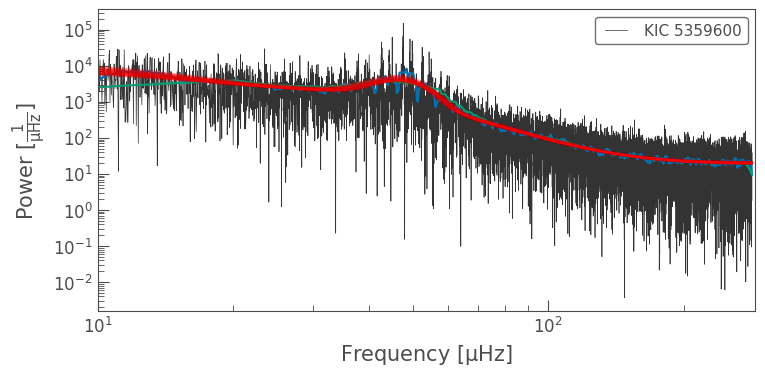

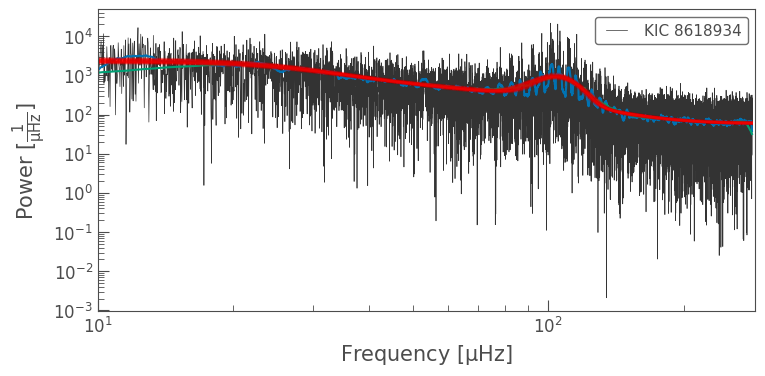

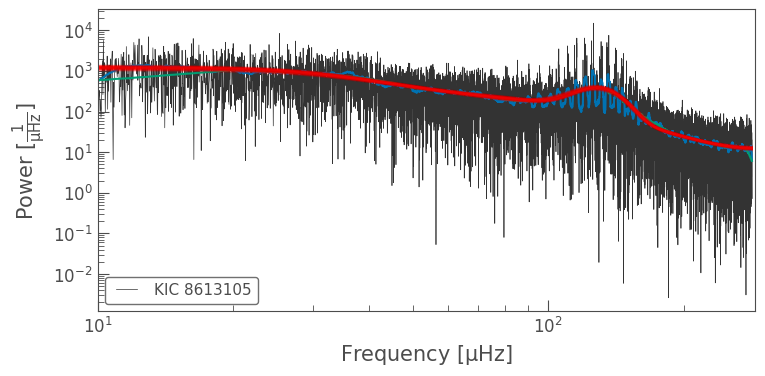

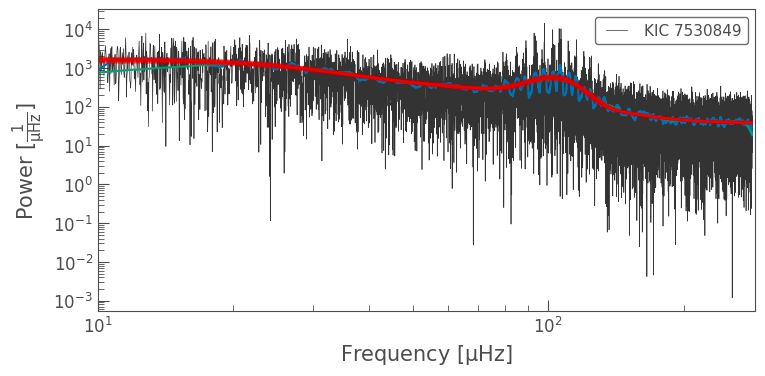

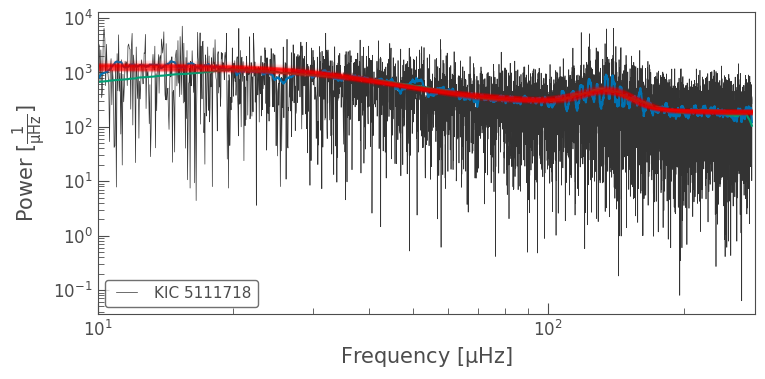

...

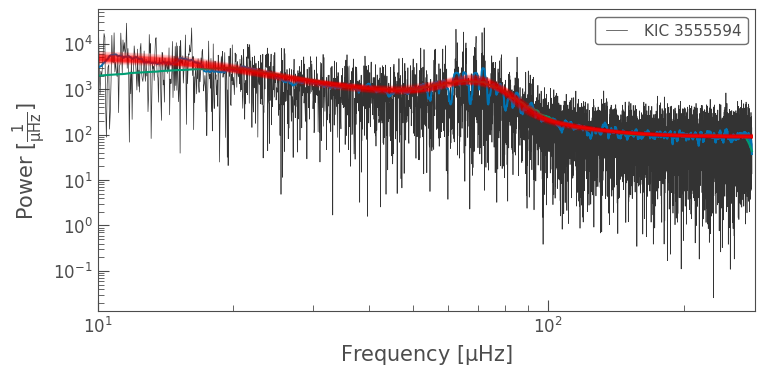

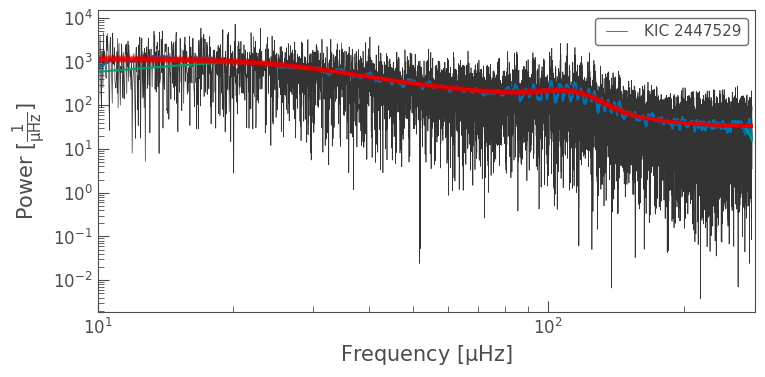

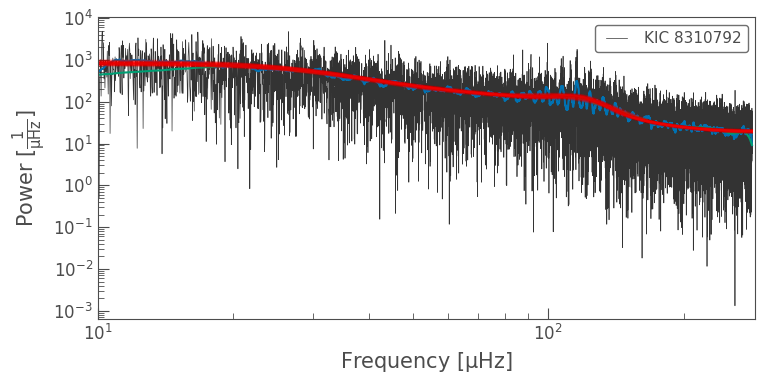

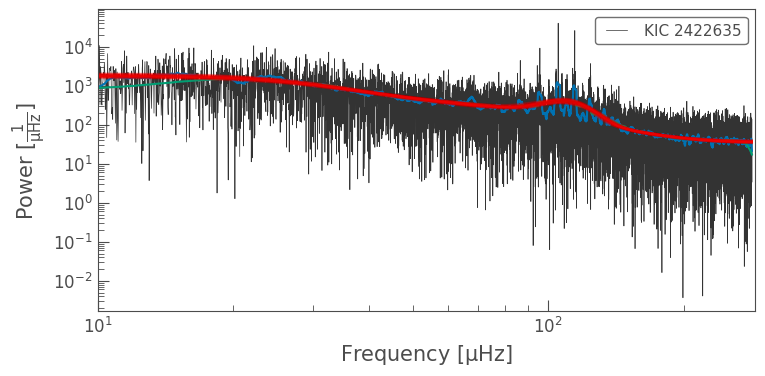

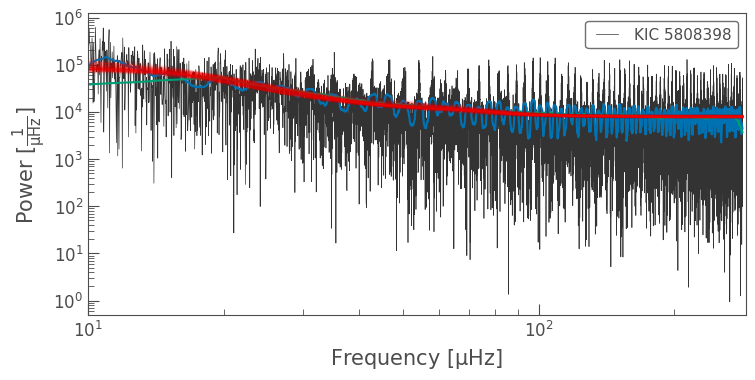

In [10]:
apo.run_n(50)

Explained variance : [0.848748   0.11309563]
           KIC    Dnu     Nmax    Teff
6268  11615890  13.18  170.653  4917.8


3964it [02:09, 30.52it/s, +200 | bound: 108 | nc: 1 | ncall: 93832 | eff(%):  4.447 | loglstar:   -inf < -31276.664 <    inf | logz: -31294.853 +/-  0.161 | dlogz:  0.001 >  0.209]


Explained variance : [0.8495261 0.1123812]
          KIC     Dnu     Nmax    Teff
3213  7983470  10.422  122.374  4714.5


3874it [02:04, 31.04it/s, +200 | bound: 108 | nc: 1 | ncall: 93554 | eff(%):  4.364 | loglstar:   -inf < -33589.891 <    inf | logz: -33607.634 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84954359 0.11223308]
          KIC    Dnu   Nmax    Teff
2957  7618122  6.976  71.66  4579.9


4341it [02:20, 30.98it/s, +200 | bound: 124 | nc: 1 | ncall: 105641 | eff(%):  4.307 | loglstar:   -inf < -31609.527 <    inf | logz: -31629.600 +/-  0.243 | dlogz:  0.001 >  0.209]


Explained variance : [0.851097   0.11179234]
          KIC    Dnu    Nmax    Teff
1245  5006454  7.116  84.662  4951.7


4209it [02:16, 30.85it/s, +200 | bound: 118 | nc: 1 | ncall: 101666 | eff(%):  4.345 | loglstar:   -inf < -28926.645 <    inf | logz: -28946.061 +/-  0.198 | dlogz:  0.001 >  0.209]


Explained variance : [0.85175964 0.11101205]
          KIC    Dnu     Nmax    Teff
3660  8493969  9.924  108.527  4736.1


4304it [02:21, 30.47it/s, +200 | bound: 119 | nc: 1 | ncall: 103389 | eff(%):  4.365 | loglstar:   -inf < -31944.406 <    inf | logz: -31964.295 +/-  0.237 | dlogz:  0.001 >  0.209]


Explained variance : [0.84402196 0.10962054]
          KIC     Dnu     Nmax    Teff
4843  9882766  13.005  164.802  4992.3


4174it [02:18, 30.22it/s, +200 | bound: 117 | nc: 1 | ncall: 101162 | eff(%):  4.332 | loglstar:   -inf < -31432.312 <    inf | logz: -31451.556 +/-  0.207 | dlogz:  0.001 >  0.209]


Explained variance : [0.85044503 0.11268519]
         KIC    Dnu    Nmax    Teff
581  3663047  5.652  54.878  4647.4


3604it [01:20, 44.91it/s, +200 | bound: 97 | nc: 1 | ncall: 85358 | eff(%):  4.467 | loglstar:   -inf < -6633.198 <    inf | logz: -6649.590 +/-  0.275 | dlogz:  0.001 >  0.209]


Explained variance : [0.85281573 0.11110785]
          KIC   Dnu    Nmax    Teff
2236  6450613  7.56  93.701  5000.2


5087it [02:27, 34.56it/s, +200 | bound: 148 | nc: 1 | ncall: 125779 | eff(%):  4.210 | loglstar:   -inf < -26273.918 <    inf | logz: -26297.713 +/-  0.318 | dlogz:  0.001 >  0.209]


Explained variance : [0.84410381 0.11711081]
           KIC    Dnu    Nmax    Teff
6543  12120872  8.444  95.041  4797.3


3870it [01:59, 32.36it/s, +200 | bound: 106 | nc: 1 | ncall: 92847 | eff(%):  4.393 | loglstar:   -inf < -32529.184 <    inf | logz: -32546.923 +/-  0.231 | dlogz:  0.001 >  0.209]


Explained variance : [0.84267294 0.11790235]
         KIC    Dnu     Nmax    Teff
131  2305992  8.894  100.209  4757.0


4082it [02:07, 31.96it/s, +200 | bound: 114 | nc: 1 | ncall: 98715 | eff(%):  4.347 | loglstar:   -inf < -32835.316 <    inf | logz: -32854.096 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84176713 0.11840482]
          KIC    Dnu    Nmax    Teff
2654  7104797  6.217  60.336  4722.8


4666it [02:17, 33.83it/s, +200 | bound: 131 | nc: 1 | ncall: 113189 | eff(%):  4.307 | loglstar:   -inf < -34790.746 <    inf | logz: -34812.449 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84764637 0.11394865]
           KIC     Dnu     Nmax    Teff
6230  11564401  10.014  115.093  4920.1


3872it [01:55, 33.64it/s, +200 | bound: 106 | nc: 1 | ncall: 92582 | eff(%):  4.408 | loglstar:   -inf < -32972.977 <    inf | logz: -32990.703 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84343706 0.11779395]
         KIC    Dnu    Nmax    Teff
779  4065054  7.239  86.065  5072.3


4094it [01:50, 36.90it/s, +200 | bound: 116 | nc: 1 | ncall: 99280 | eff(%):  4.334 | loglstar:   -inf < -16219.124 <    inf | logz: -16237.972 +/-  0.281 | dlogz:  0.001 >  0.209]


Explained variance : [0.83957974 0.12089824]
          KIC    Dnu   Nmax    Teff
3472  8292681  4.766  45.68  4844.9


4925it [02:20, 34.97it/s, +200 | bound: 143 | nc: 1 | ncall: 120788 | eff(%):  4.250 | loglstar:   -inf < -28170.771 <    inf | logz: -28193.766 +/-  0.306 | dlogz:  0.001 >  0.209]


Explained variance : [0.84537878 0.11646936]
          KIC     Dnu     Nmax    Teff
4683  9719012  15.087  193.839  4965.3


4114it [02:06, 32.49it/s, +200 | bound: 114 | nc: 1 | ncall: 99076 | eff(%):  4.363 | loglstar:   -inf < -31346.260 <    inf | logz: -31365.206 +/-  0.291 | dlogz:  0.001 >  0.209]


Explained variance : [0.84359793 0.11837427]
         KIC    Dnu     Nmax    Teff
471  3449870  9.295  109.727  4831.1


3562it [01:44, 34.24it/s, +200 | bound: 97 | nc: 1 | ncall: 84758 | eff(%):  4.449 | loglstar:   -inf < -35944.703 <    inf | logz: -35960.887 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84987097 0.1148285 ]
          KIC     Dnu     Nmax    Teff
4473  9512635  11.724  139.191  4944.1


3898it [01:59, 32.61it/s, +200 | bound: 107 | nc: 1 | ncall: 93126 | eff(%):  4.410 | loglstar:   -inf < -33742.898 <    inf | logz: -33760.750 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84608224 0.11662999]
          KIC    Dnu    Nmax    Teff
4448  9470276  7.039  75.013  4742.6


4156it [02:04, 33.39it/s, +200 | bound: 115 | nc: 1 | ncall: 100167 | eff(%):  4.357 | loglstar:   -inf < -30742.254 <    inf | logz: -30761.392 +/-  0.209 | dlogz:  0.001 >  0.209]


Explained variance : [0.84666083 0.1163321 ]
          KIC     Dnu     Nmax    Teff
1007  4587050  14.406  187.684  4828.6


3534it [01:43, 34.26it/s, +200 | bound: 95 | nc: 1 | ncall: 83431 | eff(%):  4.486 | loglstar:   -inf < -36130.023 <    inf | logz: -36146.066 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.8463574  0.11643227]
          KIC    Dnu    Nmax    Teff
2829  7430104  8.026  99.457  5075.1


4045it [01:58, 34.00it/s, +200 | bound: 113 | nc: 1 | ncall: 97356 | eff(%):  4.369 | loglstar:   -inf < -32532.844 <    inf | logz: -32551.444 +/-  0.206 | dlogz:  0.001 >  0.209]


Explained variance : [0.84161916 0.12017512]
          KIC    Dnu    Nmax    Teff
4663  9711231  5.138  47.265  4655.3


4879it [02:18, 35.11it/s, +200 | bound: 138 | nc: 1 | ncall: 118757 | eff(%):  4.284 | loglstar:   -inf < -30120.617 <    inf | logz: -30143.381 +/-  0.284 | dlogz:  0.001 >  0.209]
/Users/grd/Repos/matriculate/matriculate_env/lib/python3.9/site-packages/lightkurve/periodogram.py:364: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


Explained variance : [0.84709407 0.11594898]
         KIC     Dnu     Nmax    Teff
826  4168909  11.585  142.173  4738.4


3724it [01:44, 35.65it/s, +200 | bound: 102 | nc: 1 | ncall: 89061 | eff(%):  4.416 | loglstar:   -inf < -18931.574 <    inf | logz: -18948.565 +/-  0.255 | dlogz:  0.001 >  0.209]


Explained variance : [0.84690877 0.11592609]
          KIC    Dnu    Nmax    Teff
1943  5983299  5.803  63.431  4902.2


4292it [02:08, 33.43it/s, +200 | bound: 121 | nc: 1 | ncall: 104767 | eff(%):  4.296 | loglstar:   -inf < -28174.916 <    inf | logz: -28194.748 +/-  0.244 | dlogz:  0.001 >  0.209]


Explained variance : [0.84672108 0.11652427]
           KIC    Dnu    Nmax    Teff
5173  10227872  7.891  93.605  5039.7


4118it [02:05, 32.86it/s, +200 | bound: 115 | nc: 1 | ncall: 99183 | eff(%):  4.362 | loglstar:   -inf < -31732.525 <    inf | logz: -31751.492 +/-  0.243 | dlogz:  0.001 >  0.209]


Explained variance : [0.84658143 0.11672795]
          KIC    Dnu     Nmax    Teff
2784  7350897  11.12  129.833  5073.2


3911it [01:58, 33.12it/s, +200 | bound: 109 | nc: 1 | ncall: 94675 | eff(%):  4.351 | loglstar:   -inf < -33190.566 <    inf | logz: -33208.487 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84653091 0.11673012]
           KIC   Dnu     Nmax    Teff
6440  11924919  9.32  113.821  4869.4


3979it [01:58, 33.48it/s, +200 | bound: 109 | nc: 1 | ncall: 95213 | eff(%):  4.398 | loglstar:   -inf < -29574.023 <    inf | logz: -29592.298 +/-  0.226 | dlogz:  0.001 >  0.209]


Explained variance : [0.84593014 0.11731021]
         KIC     Dnu     Nmax    Teff
408  3337536  10.167  110.955  4805.6


4165it [02:07, 32.73it/s, +200 | bound: 117 | nc: 1 | ncall: 100746 | eff(%):  4.341 | loglstar:   -inf < -33724.094 <    inf | logz: -33743.306 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.8464092  0.11693359]
           KIC    Dnu    Nmax    Teff
6557  12165692  9.025  99.431  4805.0


4222it [02:08, 32.74it/s, +200 | bound: 120 | nc: 1 | ncall: 102417 | eff(%):  4.326 | loglstar:   -inf < -37823.961 <    inf | logz: -37843.446 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84774824 0.11571492]
          KIC    Dnu     Nmax    Teff
2900  7533995  9.576  106.357  4652.5


4177it [02:08, 32.52it/s, +200 | bound: 118 | nc: 1 | ncall: 101261 | eff(%):  4.331 | loglstar:   -inf < -31671.643 <    inf | logz: -31690.894 +/-  0.173 | dlogz:  0.001 >  0.209]


Explained variance : [0.84640982 0.11692298]
           KIC    Dnu    Nmax    Teff
4999  10031091  9.834  120.86  4973.0


3579it [01:43, 34.72it/s, +200 | bound: 98 | nc: 1 | ncall: 85535 | eff(%):  4.428 | loglstar:   -inf < -34840.742 <    inf | logz: -34857.006 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.84601935 0.11729074]
         KIC     Dnu     Nmax    Teff
756  4042977  10.744  137.467  4862.7


3880it [01:55, 33.61it/s, +200 | bound: 106 | nc: 1 | ncall: 92433 | eff(%):  4.424 | loglstar:   -inf < -31721.412 <    inf | logz: -31739.190 +/-  0.246 | dlogz:  0.001 >  0.209]


Explained variance : [0.84737305 0.11559519]
          KIC    Dnu    Nmax    Teff
3996  8936339  4.602  44.144  4833.2


4569it [02:00, 37.82it/s, +200 | bound: 129 | nc: 1 | ncall: 110289 | eff(%):  4.332 | loglstar:   -inf < -30979.750 <    inf | logz: -31000.959 +/-  0.229 | dlogz:  0.001 >  0.209]


Explained variance : [0.84816577 0.11549029]
          KIC    Dnu   Nmax    Teff
3916  8813509  4.551  43.65  4767.3


4738it [02:14, 35.30it/s, +200 | bound: 134 | nc: 1 | ncall: 115372 | eff(%):  4.288 | loglstar:   -inf < -29637.918 <    inf | logz: -29659.961 +/-  0.303 | dlogz:  0.001 >  0.209]


Explained variance : [0.8473212  0.11699422]
           KIC   Dnu     Nmax    Teff
5191  10262542  9.28  104.227  4896.3


4071it [02:04, 32.75it/s, +200 | bound: 111 | nc: 1 | ncall: 97240 | eff(%):  4.401 | loglstar:   -inf < -31018.043 <    inf | logz: -31036.768 +/-  0.222 | dlogz:  0.001 >  0.209]


Explained variance : [0.8603453  0.10715515]
          KIC    Dnu    Nmax    Teff
4198  9164696  8.877  99.339  4782.8


4107it [02:07, 32.27it/s, +200 | bound: 115 | nc: 1 | ncall: 98791 | eff(%):  4.369 | loglstar:   -inf < -33454.430 <    inf | logz: -33473.348 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.8483956  0.11620046]
          KIC    Dnu    Nmax    Teff
2464  6786177  8.443  96.427  4785.9


3914it [01:59, 32.69it/s, +200 | bound: 109 | nc: 1 | ncall: 93892 | eff(%):  4.391 | loglstar:   -inf < -33375.781 <    inf | logz: -33393.724 +/-  0.111 | dlogz:  0.001 >  0.209]


Explained variance : [0.8526413  0.11277626]
           KIC    Dnu   Nmax    Teff
5654  10866415  8.732  94.16  4740.9


4029it [02:04, 32.26it/s, +200 | bound: 111 | nc: 1 | ncall: 96779 | eff(%):  4.379 | loglstar:   -inf < -30532.352 <    inf | logz: -30550.862 +/-  0.276 | dlogz:  0.001 >  0.209]


Explained variance : [0.85252162 0.11187299]
          KIC    Dnu    Nmax    Teff
2863  7466616  6.309  75.521  5023.3


4201it [02:01, 34.45it/s, +200 | bound: 116 | nc: 1 | ncall: 101109 | eff(%):  4.361 | loglstar:   -inf < -30299.568 <    inf | logz: -30318.932 +/-  0.225 | dlogz:  0.001 >  0.209]


Explained variance : [0.85130678 0.11397875]
          KIC    Dnu    Nmax    Teff
4783  9824874  7.411  76.711  4674.7


4185it [02:07, 32.77it/s, +200 | bound: 116 | nc: 1 | ncall: 100783 | eff(%):  4.360 | loglstar:   -inf < -33934.180 <    inf | logz: -33953.480 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.8505145  0.11470047]
          KIC    Dnu    Nmax    Teff
1001  4579125  6.273  60.897  4593.1


/Users/grd/Repos/matriculate/matriculate_env/lib/python3.9/site-packages/lightkurve/search.py:475: LightkurveWarning: Cannot download from an empty search result.
  warnings.warn(


Failed on 39
'NoneType' object has no attribute 'stitch'
Explained variance : [0.85354405 0.11141003]
          KIC     Dnu     Nmax    Teff
1629  5524229  12.781  151.491  4940.0


4088it [02:06, 32.41it/s, +200 | bound: 114 | nc: 1 | ncall: 98418 | eff(%):  4.366 | loglstar:   -inf < -31093.391 <    inf | logz: -31112.201 +/-  0.214 | dlogz:  0.001 >  0.209]


Explained variance : [0.85352571 0.11138936]
           KIC    Dnu    Nmax    Teff
5296  10403323  3.728  28.639  4721.3


6027it [02:50, 35.43it/s, +200 | bound: 181 | nc: 1 | ncall: 151532 | eff(%):  4.115 | loglstar:   -inf < -31451.605 <    inf | logz: -31480.082 +/-  0.306 | dlogz:  0.001 >  0.209]


Explained variance : [0.8555486  0.11083868]
          KIC     Dnu     Nmax    Teff
4765  9811950  10.431  123.087  4710.8


4151it [02:06, 32.88it/s, +200 | bound: 118 | nc: 1 | ncall: 100525 | eff(%):  4.337 | loglstar:   -inf < -31806.783 <    inf | logz: -31825.914 +/-  0.234 | dlogz:  0.001 >  0.209]


Explained variance : [0.85904352 0.10827121]
        KIC     Dnu     Nmax    Teff
16  1431059  13.668  170.839  4825.5


3940it [01:58, 33.26it/s, +200 | bound: 110 | nc: 1 | ncall: 94906 | eff(%):  4.371 | loglstar:   -inf < -36069.258 <    inf | logz: -36087.329 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.85398227 0.11148953]
         KIC     Dnu     Nmax    Teff
636  3833819  12.387  153.318  4828.6


4110it [02:07, 32.29it/s, +200 | bound: 116 | nc: 1 | ncall: 99204 | eff(%):  4.353 | loglstar:   -inf < -31646.531 <    inf | logz: -31665.465 +/-  0.277 | dlogz:  0.001 >  0.209]


Explained variance : [0.85669388 0.11012746]
        KIC    Dnu    Nmax    Teff
92  2161409  8.596  99.226  4814.9


3790it [01:55, 32.87it/s, +200 | bound: 105 | nc: 1 | ncall: 90885 | eff(%):  4.400 | loglstar:   -inf < -36850.375 <    inf | logz: -36867.700 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.85993309 0.10642722]
           KIC    Dnu    Nmax    Teff
5171  10226276  6.048  60.963  4620.1


4429it [02:13, 33.06it/s, +200 | bound: 126 | nc: 1 | ncall: 107626 | eff(%):  4.309 | loglstar:   -inf < -31175.945 <    inf | logz: -31196.454 +/-  0.258 | dlogz:  0.001 >  0.209]


Explained variance : [0.86250005 0.10588289]
          KIC    Dnu    Nmax    Teff
4779  9822609  5.791  54.526  4564.7


4305it [02:07, 33.64it/s, +200 | bound: 120 | nc: 1 | ncall: 103654 | eff(%):  4.355 | loglstar:   -inf < -34856.188 <    inf | logz: -34876.075 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.86042086 0.10680287]
          KIC     Dnu     Nmax    Teff
3810  8674172  11.012  125.497  4823.7


4067it [02:02, 33.10it/s, +200 | bound: 114 | nc: 1 | ncall: 98592 | eff(%):  4.337 | loglstar:   -inf < -34295.234 <    inf | logz: -34313.951 +/-    nan | dlogz:  0.001 >  0.209]


Explained variance : [0.86409102 0.10357292]
          KIC   Dnu    Nmax    Teff
3497  8315796  8.88  99.678  4788.3


4232it [02:09, 32.70it/s, +200 | bound: 118 | nc: 1 | ncall: 101796 | eff(%):  4.362 | loglstar:   -inf < -33338.273 <    inf | logz: -33357.805 +/-    nan | dlogz:  0.001 >  0.209]


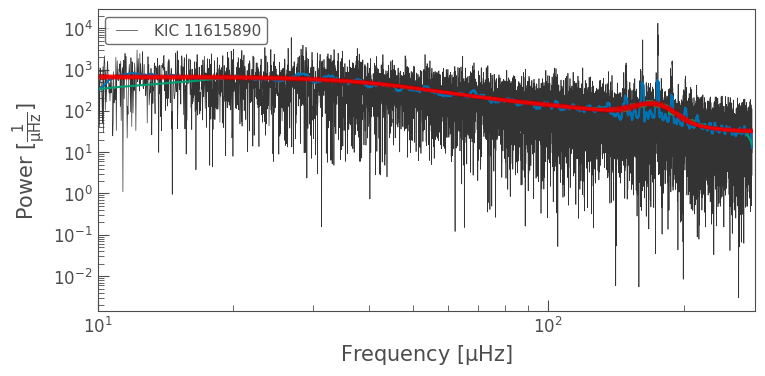

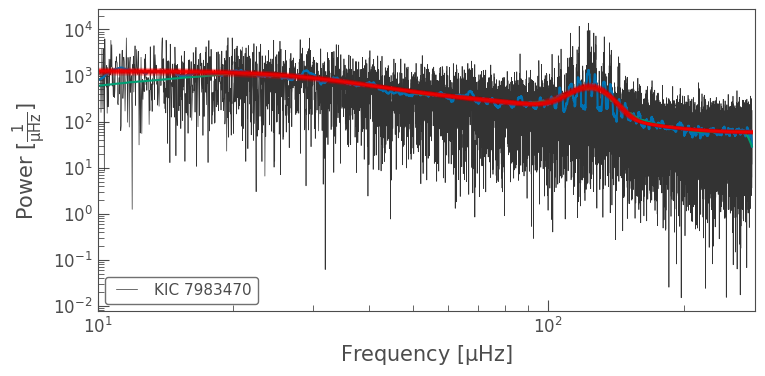

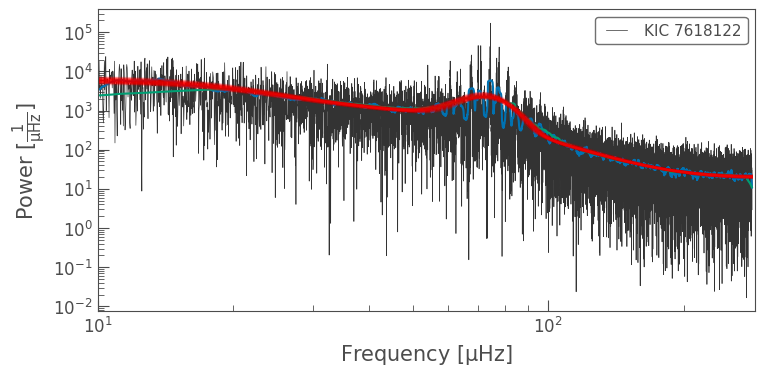

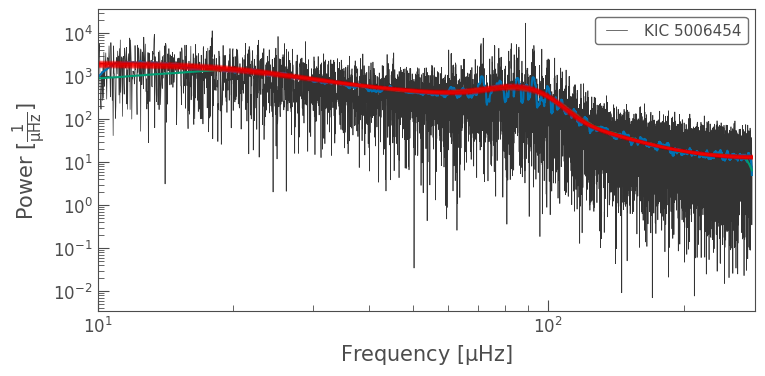

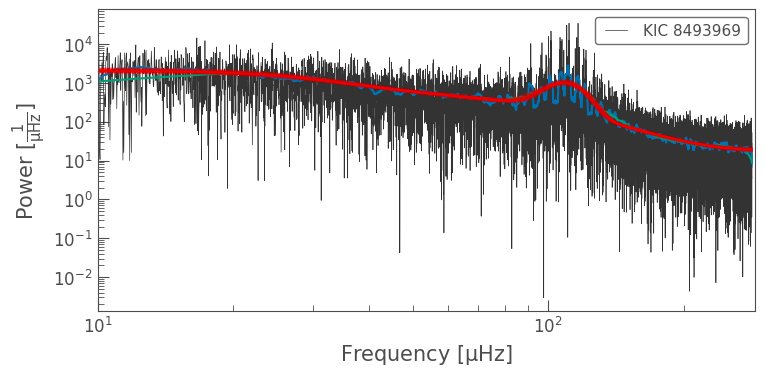

...

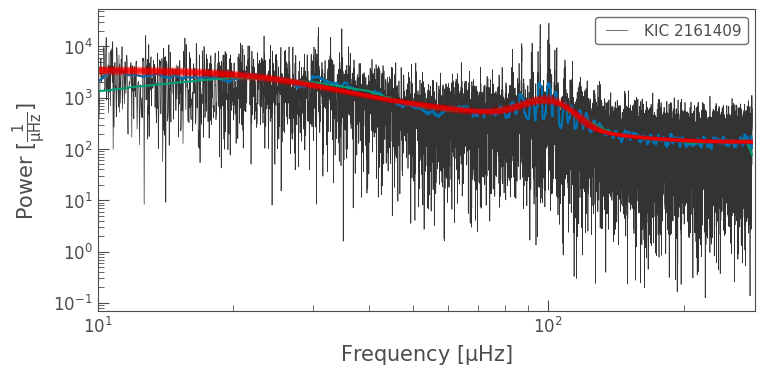

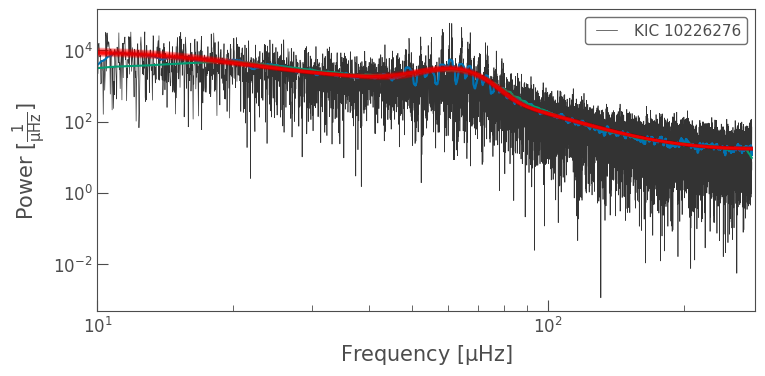

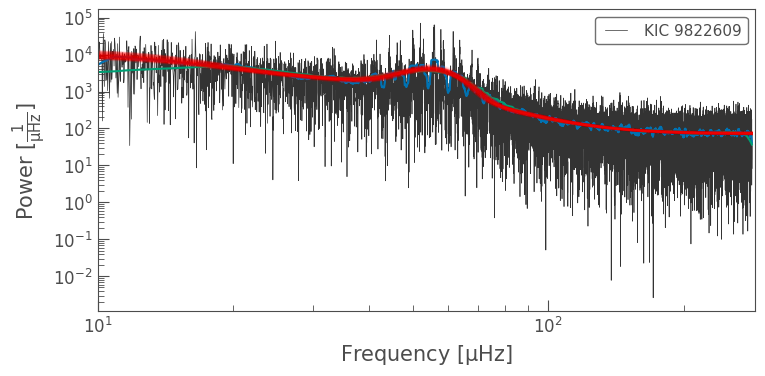

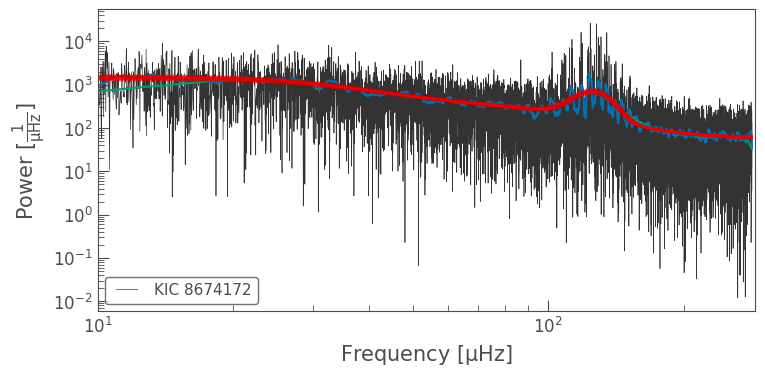

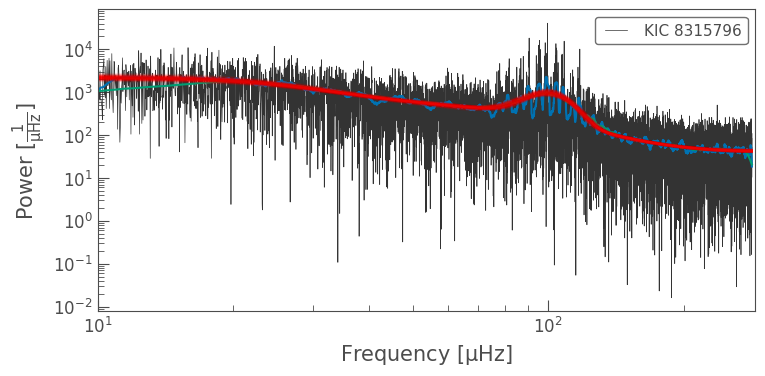

In [11]:
apo.run_n(50)